# An Analysis of Wind Speeds in the North Sea

---

### Data

We will be working with [data](https://opendata.dwd.de/climate_environment/CDC/observations_germany/climate/10_minutes/) collected by [DWD](https://dwd.de) on Helgoland in a 10-minute intervall from 1996 to 2022. For loading the data, we have to manually collect the from a http server.


### Imports and Usage

You can simply use the `environment.yml` file to create a new conda environment with all the needed packages by running `conda env create -f environment.yml`. The only relevant parameter you may want to change is `RELOAD`. If set to `True`, all the needed data will be downloaded and saved in the `data/` folder.

## Data Loading

In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import requests as rq
import zipfile
from bs4 import BeautifulSoup
import os
import seaborn as sns
import pickle
#import sklearn
#from sklearn.linear_model import LinearRegression
import math

plt.rcParams['figure.dpi'] = 400

plt.rcParams['figure.figsize'] = [8, 6]

# set true to download the data and unzip into the current directory
RELOAD = False
ZIP_NAME = "data.zip"
DATA_FOLDER = "data"

DATA_BASE_URL = "https://opendata.dwd.de/climate_environment/CDC/observations_germany/climate/10_minutes/"
KINDS = ["wind", "air_temperature", "precipitation", "solar"]
METRIC_URLS = [DATA_BASE_URL + postfix + "/historical/" for postfix in KINDS]
print(METRIC_URLS)

['https://opendata.dwd.de/climate_environment/CDC/observations_germany/climate/10_minutes/wind/historical/', 'https://opendata.dwd.de/climate_environment/CDC/observations_germany/climate/10_minutes/air_temperature/historical/', 'https://opendata.dwd.de/climate_environment/CDC/observations_germany/climate/10_minutes/precipitation/historical/', 'https://opendata.dwd.de/climate_environment/CDC/observations_germany/climate/10_minutes/solar/historical/']


In [3]:
def download_and_extract(url: str, kind: str, station_id: str = "02115") -> dict:
    response = rq.get(url)
    soup = BeautifulSoup(response.text, "html.parser")

    # find dataset desciption (pdf)
    descr_resp = rq.get(f"{DATA_BASE_URL}/{kind}")
    descr_soup = BeautifulSoup(descr_resp.text, "html.parser")
    descriptions = [a.get("href") for a in descr_soup.find_all("a", href=True) if a.get("href").__contains__("pdf")]
    descrs_resps = list(map(lambda desc: rq.get(f"{DATA_BASE_URL}/{kind}/{desc}"), descriptions))

    # Extract all links with data of the appropiate station
    links = [a.get("href") for a in soup.find_all('a', href=True) if a.get("href").__contains__(station_id)]
    print(f"Found links: {links}")

    responses = [rq.get(url + file) for file in links]

    # check if we need to create folders
    save_path = os.path.join("data", kind)
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    
    # save dataset description pdfs
    for descr, resp in zip(descriptions, descrs_resps):
        with open(os.path.join(save_path, descr), "wb") as file:
            file.write(resp.content)

    # for each matching response download the zip and extract it
    files = [] # remember file names of the extracted zip files
    for i, r in enumerate(responses):
        zip_name = os.path.join("data", kind, f"file{i}.zip")
        with open(zip_name, "wb") as z:
            z.write(r.content)

        with zipfile.ZipFile(zip_name, "r") as zip_file:
            for filename in zip_file.namelist():
                files.append(os.path.join(save_path, filename))
            zip_file.extractall(os.path.join("data", kind))

        # we don't need the zip anymore
        os.remove(zip_name)
    
    return files

# have mapping of metric to relevant files for loading into dataframes later on
kind_files = { kind : [] for kind in KINDS }
kind_file_paths = os.path.join("data", "contents.pickle")
if RELOAD:
    for kind, folder in zip(KINDS, METRIC_URLS):
        print(f"{kind}: {folder}")
        files = download_and_extract(folder, kind)
        kind_files[kind] = files

    with open(os.path.join(kind_file_paths), 'wb') as handle:
        pickle.dump(kind_files, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
else:
    with open(kind_file_paths, 'rb') as handle:
        kind_files = pickle.load(handle)

for kind in KINDS:
    print(f"Files containing {kind} data:\n\t{kind_files[kind]}")

Files containing wind data:
	['data\\wind\\produkt_zehn_min_ff_19961220_19991231_02115.txt', 'data\\wind\\produkt_zehn_min_ff_20000101_20091231_02115.txt', 'data\\wind\\produkt_zehn_min_ff_20100101_20191231_02115.txt', 'data\\wind\\produkt_zehn_min_ff_20200101_20221231_02115.txt']
Files containing air_temperature data:
	['data\\air_temperature\\produkt_zehn_min_tu_19961219_19991231_02115.txt', 'data\\air_temperature\\produkt_zehn_min_tu_20000101_20091231_02115.txt', 'data\\air_temperature\\produkt_zehn_min_tu_20100101_20191231_02115.txt', 'data\\air_temperature\\produkt_zehn_min_tu_20200101_20221231_02115.txt']
Files containing precipitation data:
	['data\\precipitation\\produkt_zehn_min_rr_19961219_19991231_02115.txt', 'data\\precipitation\\produkt_zehn_min_rr_20000101_20091231_02115.txt', 'data\\precipitation\\produkt_zehn_min_rr_20100101_20191231_02115.txt', 'data\\precipitation\\produkt_zehn_min_rr_20200101_20221231_02115.txt']
Files containing solar data:
	['data\\solar\\produkt_z

In [4]:
kind_df = { kind: None for kind in KINDS }
for kind, files in kind_files.items():
    dfs = []
    for file in files:
        df = pd.read_csv(file, sep=";")
        df["MESS_DATUM"] = pd.to_datetime(df["MESS_DATUM"], format="%Y%m%d%H%M")
        dfs.append(df)
    df = pd.concat(dfs)
    df.sort_values(by="MESS_DATUM", inplace=True)
    df.columns = map(lambda c: c if c == "STATIONS_ID" or c == "MESS_DATUM" else f"{c}_{kind}", df.columns)
    print(f"{kind}:\n{df.describe()}")
    kind_df[kind] = df

wind:
       STATIONS_ID                     MESS_DATUM       QN_wind    FF_10_wind  \
count    1348857.0                        1348857  1.348857e+06  1.348857e+06   
mean        2115.0  2010-02-09 21:28:30.455297280  2.267581e+00 -3.537724e+01   
min         2115.0            1996-12-19 10:40:00  1.000000e+00 -9.990000e+02   
25%         2115.0            2003-09-13 20:10:00  1.000000e+00  4.800000e+00   
50%         2115.0            2010-02-13 02:20:00  3.000000e+00  7.400000e+00   
75%         2115.0            2016-07-12 20:40:00  3.000000e+00  1.030000e+01   
max         2115.0            2022-12-31 23:50:00  3.000000e+00  5.180000e+01   
std            0.0                            NaN  9.586172e-01  2.046541e+02   

         DD_10_wind  
count  1.348857e+06  
mean   1.529980e+02  
min   -9.990000e+02  
25%    1.200000e+02  
50%    2.100000e+02  
75%    2.800000e+02  
max    3.600000e+02  
std    2.606936e+02  
air_temperature:
       STATIONS_ID                     MESS_DATUM

In [5]:
dfs = list(kind_df.values())
df = pd.merge(dfs[0], dfs[1], on=["MESS_DATUM", "STATIONS_ID"], how="inner", suffixes=tuple(list(map(lambda x: "_" + x, kind_df.keys()))[:2]))

# Loop through the remaining DataFrames and merge with the result
for i, df1 in enumerate(dfs[2:]):
    df = pd.merge(df, df1, on=["MESS_DATUM", "STATIONS_ID"], how="inner", suffixes=(None, "_" + list(kind_df.keys())[i+2]))

# Display the result
df

,STATIONS_ID,MESS_DATUM,QN_wind,FF_10_wind,DD_10_wind,eor_wind,QN_air_temperature,PP_10_air_temperature,TT_10_air_temperature,TM5_10_air_temperature,...,RWS_IND_10_precipitation,QN_precipitation,eor_precipitation,QN_solar,DS_10_solar,GS_10_solar,SD_10_solar,LS_10_solar,QN_solar,eor_solar
0,2115,1996-12-19 10:40:00,1,15.8,70,eor,1.0,1008.2,2.0,1.9,...,0,NaN,NaN,1.0,-999.0,-999.0,0.0,-999,NaN,NaN
1,2115,1996-12-19 10:50:00,1,16.2,70,eor,1.0,1008.1,2.0,1.9,...,0,NaN,NaN,1.0,-999.0,-999.0,0.0,-999,NaN,NaN
2,2115,1996-12-19 11:00:00,1,16.6,70,eor,1.0,1008.1,2.1,2.1,...,0,NaN,NaN,1.0,-999.0,-999.0,0.0,-999,NaN,NaN
3,2115,1996-12-19 11:10:00,1,16.0,80,eor,1.0,1008.1,2.3,2.2,...,0,NaN,NaN,1.0,-999.0,-999.0,0.0,-999,NaN,NaN
4,2115,1996-12-19 11:20:00,1,16.3,70,eor,1.0,1008.0,2.1,2.0,...,0,NaN,NaN,1.0,-999.0,-999.0,0.0,-999,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1348936,2115,2022-12-31 23:10:00,3,13.6,230,eor,NaN,1000.6,11.1,10.3,...,0,3.0,eor,NaN,0.0,0.0,0.0,-999,3.0,eor
1348937,2115,2022-12-31 23:20:00,3,12.4,230,eor,NaN,1000.6,10.9,10.2,...,0,3.0,eor,NaN,0.0,0.0,0.0,-999,3.0,eor
1348938,2115,2022-12-31 23:30:00,3,12.6,230,eor,NaN,1000.5,11.1,10.3,...,0,3.0,eor,NaN,0.0,0.0,0.0,-999,3.0,eor
1348939,2115,2022-12-31 23:40:00,3,12.6,230,eor,NaN,1000.6,11.2,10.4,...,0,3.0,eor,NaN,0.0,0.0,0.0,-999,3.0,eor


## Explorative Data Analysis

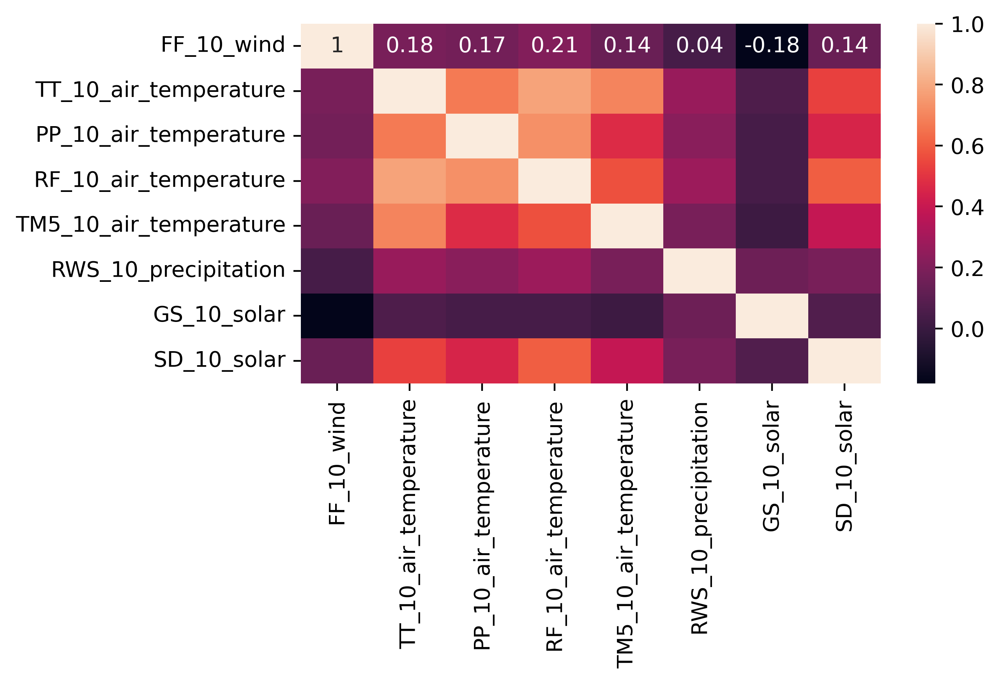

In [6]:
_ = plt.figure(figsize=(6, 3))
corr = df[["FF_10_wind", "TT_10_air_temperature", "PP_10_air_temperature", "RF_10_air_temperature", "TM5_10_air_temperature", "RWS_10_precipitation", "GS_10_solar", "SD_10_solar"]].corr().round(2)
sns.heatmap(corr, annot=True)
plt.show()

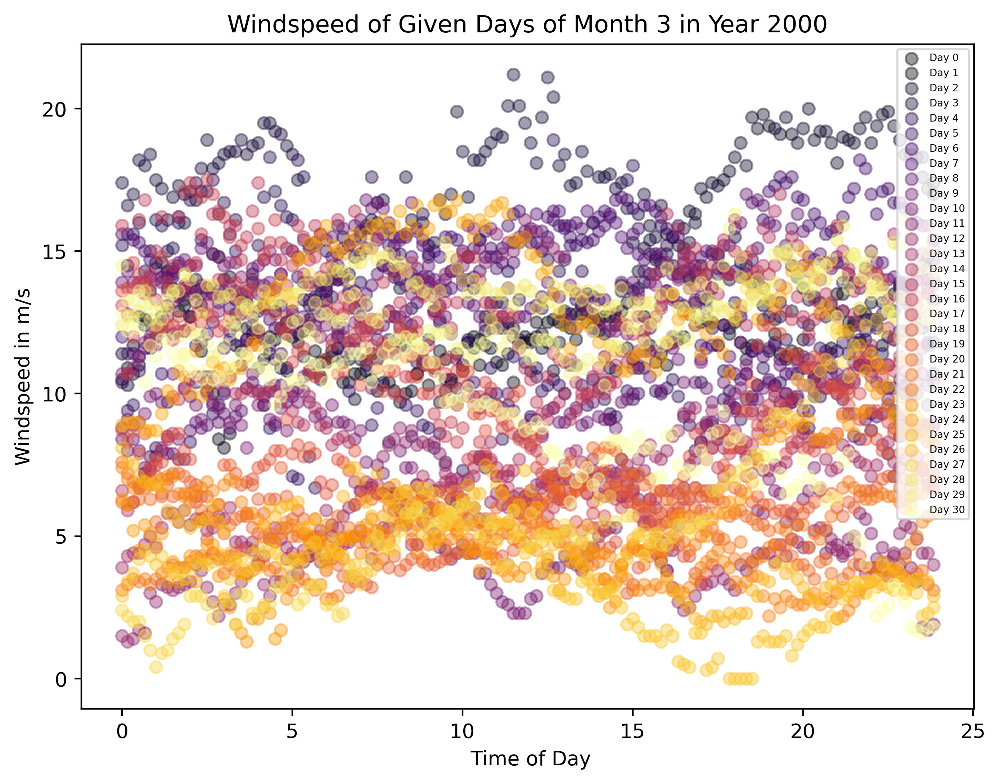

In [7]:
# Parameters for the plot shown: day, month, year
#d=1
m=3
y=2000
colors = plt.cm.inferno(np.linspace(0,1,31))
wind = kind_df["wind"]
for d in range(0,31):
    wind['FF_10_wind'] = wind['FF_10_wind'].replace(-999, float('nan'))
    mask = (wind['MESS_DATUM'].dt.day == d) & (wind['MESS_DATUM'].dt.month == m) & (wind['MESS_DATUM'].dt.year == y)
    plt.scatter( wind[mask]["MESS_DATUM"].dt.hour + (wind[mask]["MESS_DATUM"].dt.minute)*1/60, wind[mask]["FF_10_wind"] , color=colors[d], alpha=0.4, label=f'Day {d}')
# wind[mask]["MESS_DATUM"].dt.hour + (wind[mask]["MESS_DATUM"].dt.minute)*1/60 make this better...
plt.ylabel("Windspeed in m/s")
plt.xlabel(" Time of Day")
plt.title(f'Windspeed of Given Days of Month {m} in Year {y}')
plt.legend(loc='best', fontsize='5')
plt.show()

# Plot the empirical frequency of each windspeed  for each year: 


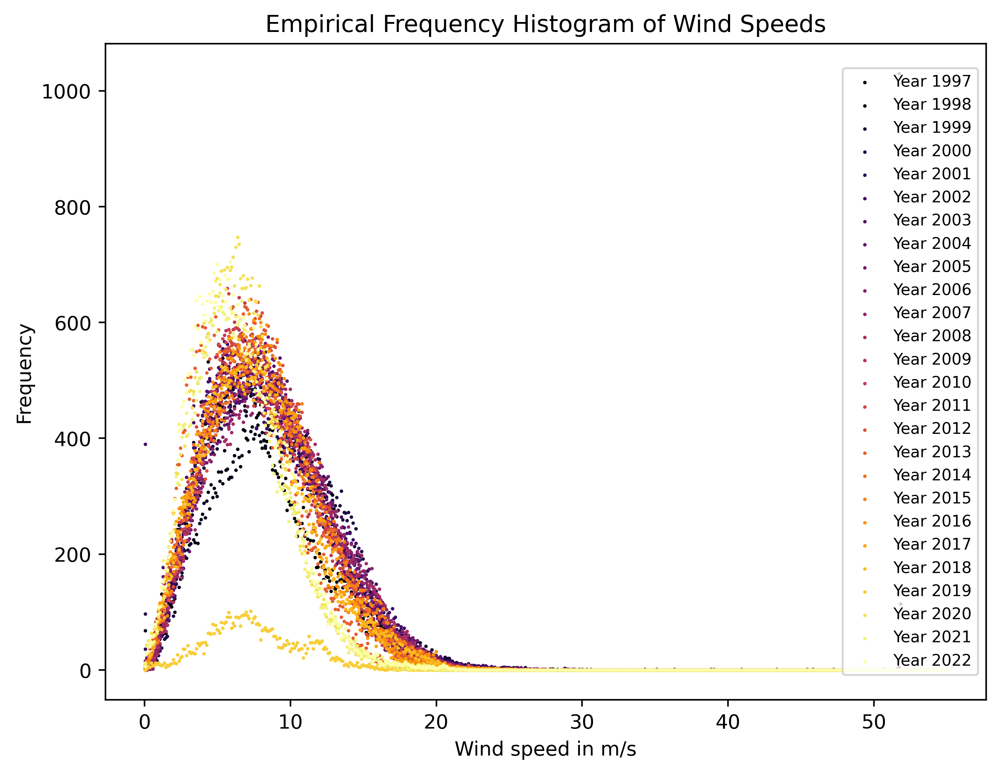

In [8]:

# Specify bin edges with specific width, start, and end
bin_edges = np.linspace(0, 55, 550) 
bin_midpoints = (bin_edges[:-1] + bin_edges[1:]) / 2


year_colors = plt.cm.inferno(np.linspace(0,1,26))
for y in range(1997, 2023):
    hist_values= np.histogram(df[(df['MESS_DATUM'].dt.year == y)]["FF_10_wind"], bins=bin_edges)[0]
    # Create a plot using midpoints and frequencies
    plt.scatter(bin_midpoints, hist_values, color= year_colors[y-1997], label=f'Year {y}', alpha=1, s=0.6) 

plt.title('Empirical Frequency Histogram of Wind Speeds')
plt.xlabel('Wind speed in m/s')
plt.ylabel('Frequency')
plt.legend(loc='right', fontsize='8')
plt.show()




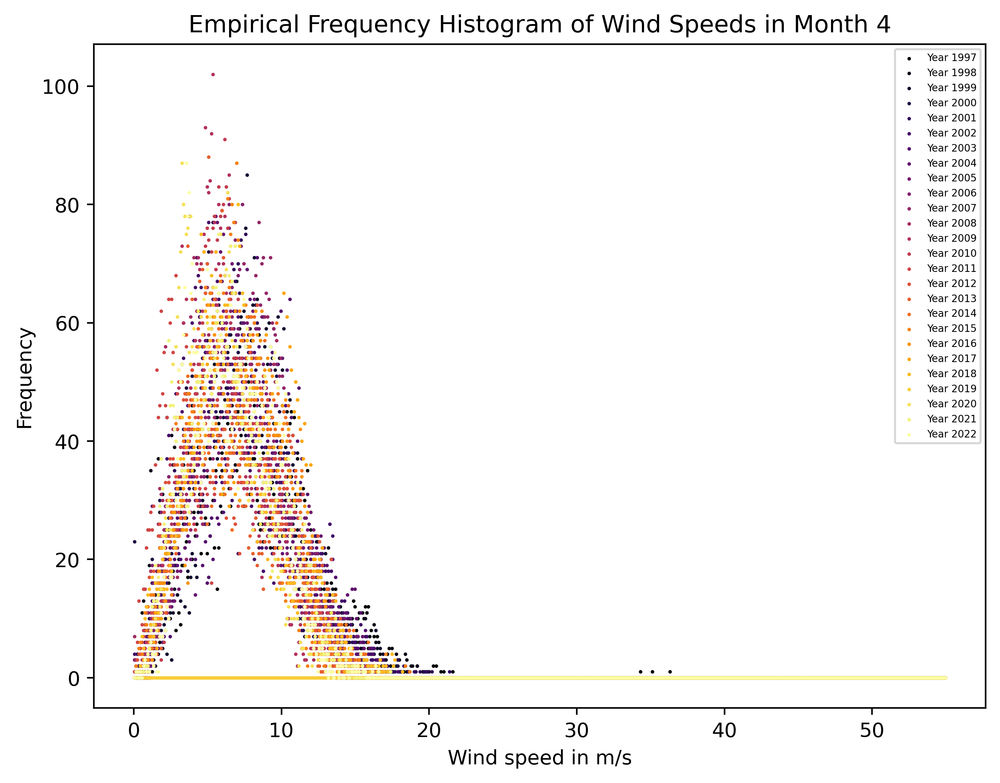

In [9]:
# plot the empirical frequency for a given month for each year: 
month=4
for y in range(1997, 2023):
    hist_values= np.histogram(df[(df['MESS_DATUM'].dt.year == y) & (df['MESS_DATUM'].dt.month == month) ]["FF_10_wind"], bins=bin_edges)[0]
    # Create a scatter plot using midpoints and frequencies
    plt.scatter(bin_midpoints, hist_values, color= year_colors[y-1997], label=f'Year {y}', alpha=1, s=0.6 )

plt.title(f'Empirical Frequency Histogram of Wind Speeds in Month {month}')
plt.xlabel('Wind speed in m/s')
plt.ylabel('Frequency')
plt.legend(loc='best', fontsize='5')
plt.show()



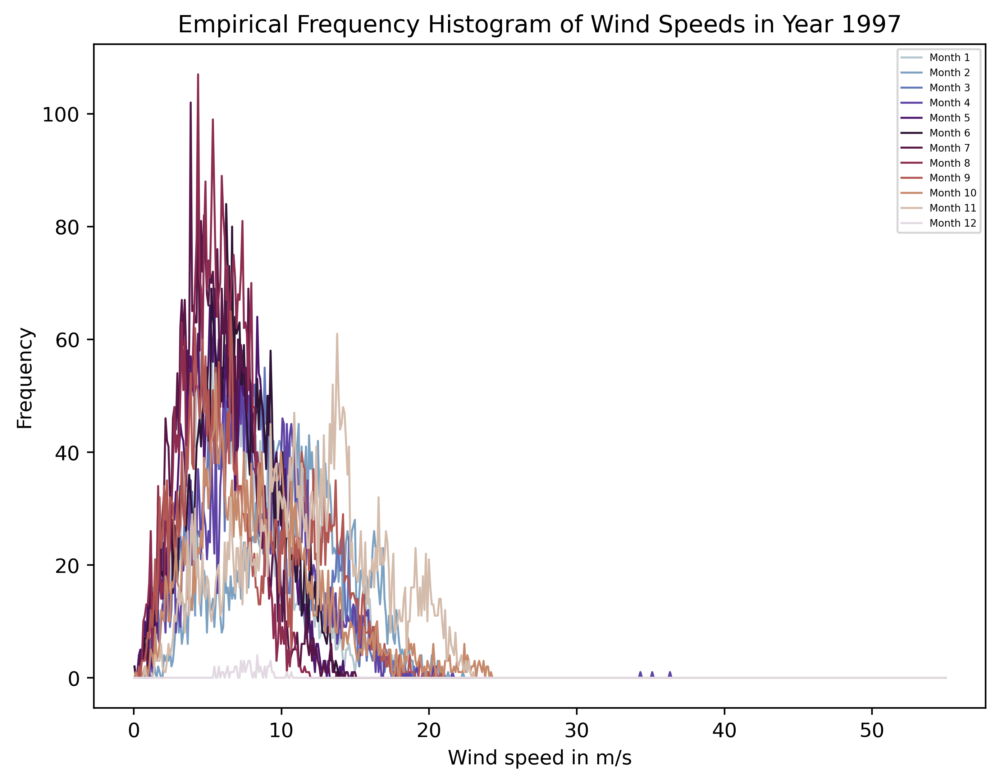

In [10]:
# plot the empirical frequency for a given year for each month: 

month_colors = plt.cm.twilight(np.linspace(0,1,13))
year=1997
for m in range(1, 13):
    hist_values= np.histogram(df[(df['MESS_DATUM'].dt.year == year) & (df['MESS_DATUM'].dt.month == m ) ]["FF_10_wind"], bins=bin_edges)[0]
    # Create a scatter plot using midpoints and frequencies
    plt.plot(bin_midpoints, hist_values, color= month_colors[m], label=f'Month {m}', alpha=1, lw=1 )

plt.title(f'Empirical Frequency Histogram of Wind Speeds in Year {year}')
plt.xlabel('Wind speed in m/s')
plt.ylabel('Frequency')
plt.legend(loc='best', fontsize='5')
plt.show()

## We find the parameters of the Weibull distribution that best fits our empirical data
 Unfortunately, on the monthly basis this is not a good fit...

7


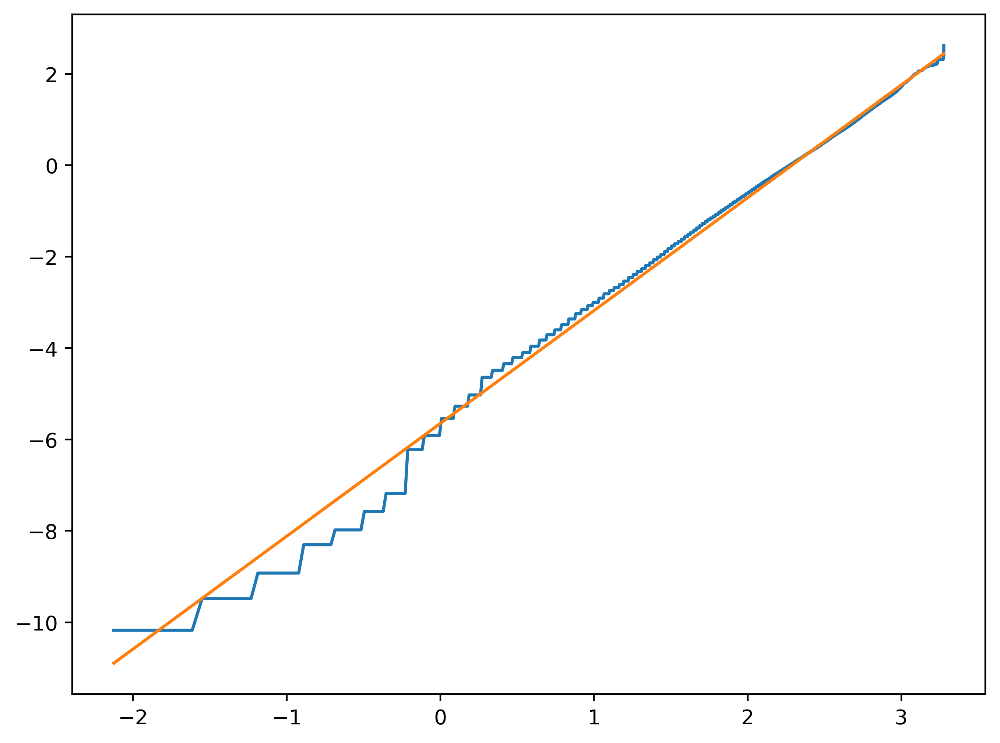

our parameters are k=2.468761958566333 and a=9.858670070937738


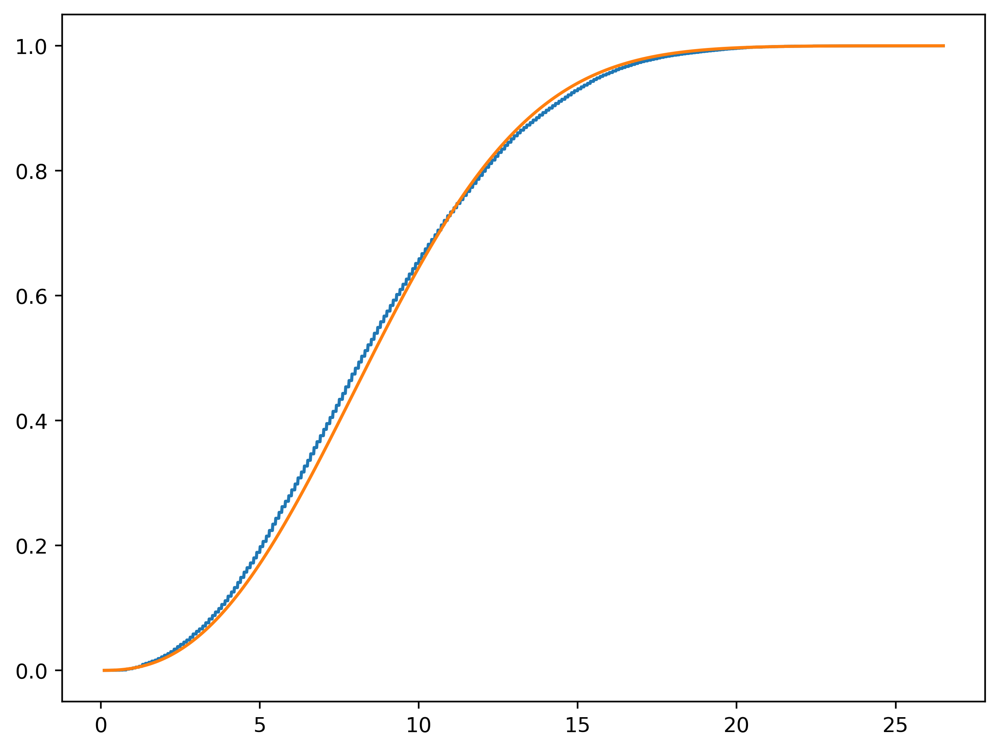

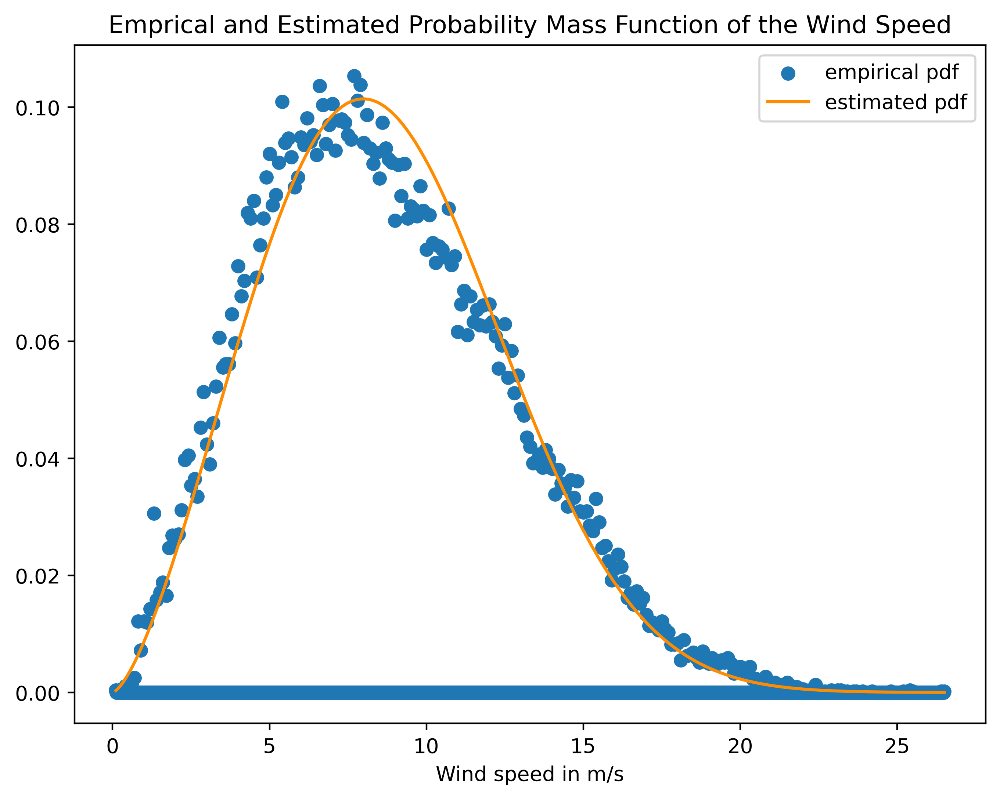

In [11]:
# Define the weibull-pdf and cdf 
def weibull_pdf( k,a,x):
    return (k/a*(x/a)**(k-1) )* np.exp( - (x/ a )**k)

def weibull_cdf( k, a,x):
    return 1-np.exp(-(x/a)**k)


# Find the parameters of the Weibull-Distribution for one year
max_included_windspeed=df[(df['MESS_DATUM'].dt.year == 2004)]["FF_10_wind"].max() #&(df['MESS_DATUM'].dt.month == 10)
min_included_windspeed=df[(df['MESS_DATUM'].dt.year == 2004)]["FF_10_wind"].min()

number_of_bins=2000
edges=np.linspace(0,max_included_windspeed, number_of_bins)
#Start by computing the empirical CDF:
empiric_pdf= np.histogram(df[(df['MESS_DATUM'].dt.year == 2004)]["FF_10_wind"], bins=edges)[0]

CDF=np.array([empiric_pdf[0]])
for i in range(1, len(empiric_pdf)):
    CDF=np.append(CDF, CDF[i-1]+empiric_pdf[i] )

# disregard the first d  bins?
#d=int(min_included_windspeed*number_of_bins/max_included_windspeed)
d=0
for i in range(0, len(CDF)):
    d=i
    if CDF[i] >0.1:
        break

print(d)
edges=edges[d:]
empiric_pdf=empiric_pdf[d:]
CDF=CDF[d:]

#normalize the CDF and the PDF
empiric_pdf=(empiric_pdf/CDF[len(CDF)-1])*10 # I CANNOT EXPLAIN THIS FACTOR 
CDF=CDF/CDF[len(CDF)-1]

#modify the CDF in order to find the Weibull parameters
mod_CDF= np.log(-np.log(1-CDF[1:] +0.000001) +0.000001) # HOW TO RESOLVE THIS PROPERLY?
log_edges=np.log(edges[2:])

# now do linear regression

linpol=np.polyfit(log_edges, mod_CDF, 1)
mod_CDF_model = np.poly1d(linpol)
#Plot the linear regression:

plt.plot( log_edges, mod_CDF)
plt.plot(log_edges, mod_CDF_model(log_edges))
plt.show()

# the Weibull-parameters are
k1=linpol[0]
a1=np.exp( - linpol[1]/linpol[0])
print(f'our parameters are k={k1} and a={a1}')


# plot the empiric pdf and the estimated pdf

plt.plot(edges[1:], CDF)
plt.plot(edges[1:], weibull_cdf(k1,a1, edges[1:]))
plt.show()

plt.scatter( edges[1:], empiric_pdf, label='empirical pdf')
plt.plot( edges[1:], weibull_pdf( k1,a1,edges[1:]), color='darkorange', label='estimated pdf')
plt.legend()
plt.title('Emprical and Estimated Probability Mass Function of the Wind Speed')
plt.xlabel('Wind speed in m/s')
plt.show()


In [12]:
# Define what we did before as a proper function that can be called:
def get_weibull_parameters( dataframe):
    max_included_windspeed=int(dataframe.max()+1)
    number_of_bins=200
    edges=np.linspace(0,max_included_windspeed, number_of_bins)
    #Start by computing the empirical CDF:
    empiric_pdf= np.histogram(dataframe, bins=edges)[0]
    CDF=np.array([empiric_pdf[0]])
    for i in range(1, len(empiric_pdf)):
        CDF=np.append(CDF, CDF[i-1]+empiric_pdf[i] )

    # disregard the first d  bins? -> This makes sure we have no near-constant part in the beginning
    d=0
    for i in range(0, len(CDF)):
        d=i
        if CDF[i] >0.1:
            break

    edges=edges[d:]
    empiric_pdf=empiric_pdf[d:]
    CDF=CDF[d:]

    #normalize the CDF and the PDF
    empiric_pdf=(empiric_pdf/CDF[len(CDF)-1])*10 # I CANNOT EXPLAIN THIS FACTOR 
    CDF=CDF/CDF[len(CDF)-1]

    #modify the CDF in order to find the Weibull parameters
    mod_CDF= np.log(-np.log(1-CDF[1:] +0.000001) +0.000001) # HOW TO RESOLVE THIS PROPERLY?
    log_edges=np.log(edges[2:])

    # now do linear regression
    linpol=np.polyfit(log_edges, mod_CDF, 1)
    mod_CDF_model = np.poly1d(linpol)
    k=linpol[0]
    a=np.exp( - linpol[1]/linpol[0])
    return [k,a]

# Test wether it's correct:
print(get_weibull_parameters(df[(df['MESS_DATUM'].dt.year == 2011)]["FF_10_wind"]))


[2.2708911250243533, 8.75996127008935]


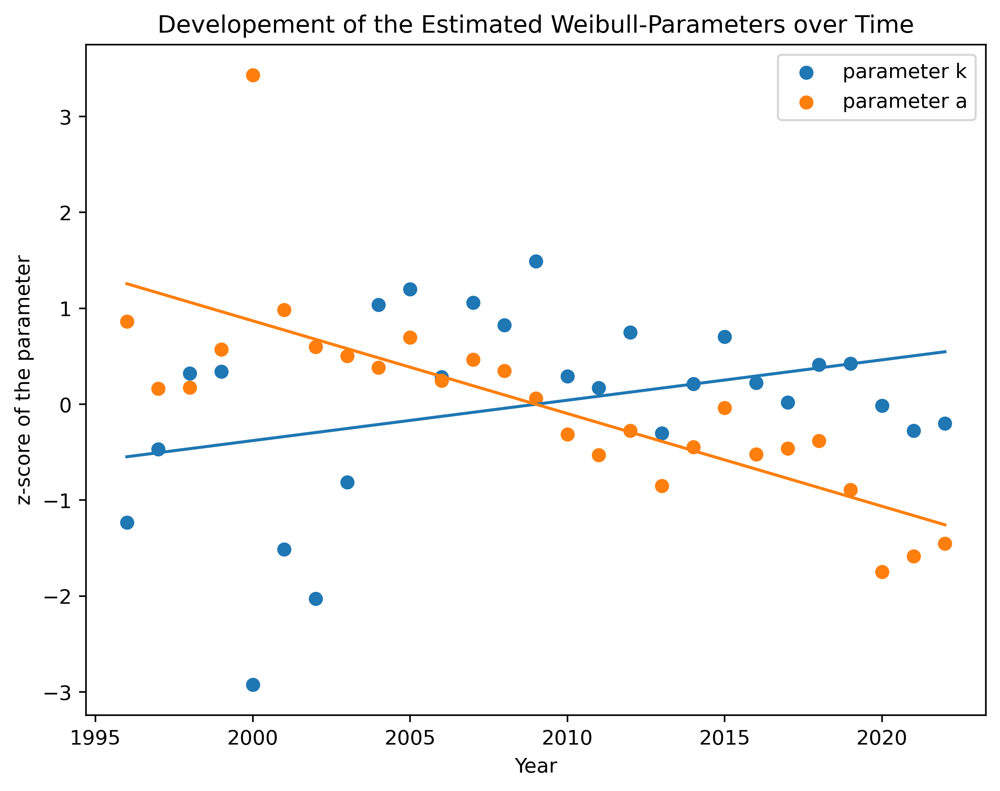

In [223]:
# plot the development of the parameters over the years: 

# add the parameters into a dataframe
yearly_df=pd.DataFrame()
year_arr=np.linspace(1996, 2022,27)
yearly_df['YEAR']=year_arr

yearly_df['parameter_k']=0.0
yearly_df['parameter_a']=0.0

for y in year_arr:
    yearly_df.loc[y-1996, 'parameter_k' ], yearly_df.loc[y-1996, 'parameter_a' ]=get_weibull_parameters(df[(df['MESS_DATUM'].dt.year == y)]["FF_10_wind"])

# find the corresponding z-scores
yearly_df['z_parameter_k']=(yearly_df['parameter_k']-yearly_df['parameter_k'].mean())/yearly_df['parameter_k'].std()

yearly_df['z_parameter_a']=(yearly_df['parameter_a']-yearly_df['parameter_a'].mean())/yearly_df['parameter_a'].std()

# plot the z-scores of the parameters and do linear regression: 
plt.scatter(year_arr, yearly_df['z_parameter_k'], label='parameter k')
plt.scatter(year_arr, yearly_df['z_parameter_a'], label='parameter a')

k_pol=np.polyfit(year_arr, yearly_df['z_parameter_k'], 1)
k_model = np.poly1d(k_pol)
plt.plot(year_arr,k_model(year_arr))

a_pol=np.polyfit(year_arr, yearly_df['z_parameter_a'], 1)
a_model = np.poly1d(a_pol)
plt.plot(year_arr,a_model(year_arr))
plt.title('Developement of the Estimated Weibull-Parameters over Time')
plt.xlabel('Year')
plt.ylabel('z-score of the parameter')
plt.legend()
plt.show()

# Evaluate the goodness of fit of the estimation of the pdf

In [14]:
# start with the mse

dataframe=df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"]
params=get_weibull_parameters(dataframe)
max_included_windspeed=int(dataframe.max()+1)
number_of_bins=200
edges=np.linspace(0,max_included_windspeed, number_of_bins)
empiric_pdf= np.histogram(dataframe, bins=edges)[0]
empiric_pdf=empiric_pdf/(empiric_pdf.sum())
mse=0
for i in range(0, len(edges)-1):
    mse=mse + (empiric_pdf[i] - (weibull_cdf(params[0], params[1],edges[i+1]) -weibull_cdf(params[0], params[1],edges[i])))**2
    
mse=1/len(empiric_pdf)*mse

print(mse)



4.19932435090687e-06


In [15]:
# do the r^2
dataframe=df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"]
params=get_weibull_parameters(dataframe)
max_included_windspeed=int(dataframe.max()+1)
number_of_bins=200
edges=np.linspace(0,max_included_windspeed, number_of_bins)
empiric_pdf= np.histogram(dataframe, bins=edges)[0]
empiric_pdf=empiric_pdf/(empiric_pdf.sum())
enum=0
for i in range(0, number_of_bins-1):
    enum=enum+(empiric_pdf[i] - (weibull_cdf(params[0], params[1],edges[i+1]) -weibull_cdf(params[0], params[1],edges[i])))**2

denom=0
for i in range(0, number_of_bins-1):
    denom=denom+(empiric_pdf[i] - 1/number_of_bins)**2   
r2=1-enum/denom

print(r2)

    

0.8591354522394716


In [16]:
# do the r^2 for the cdf
dataframe=df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"]
params=get_weibull_parameters(dataframe)
max_included_windspeed=int(dataframe.max()+1)
number_of_bins=200
edges=np.linspace(0,max_included_windspeed, number_of_bins)
empiric_pdf= np.histogram(dataframe, bins=edges)[0]
empiric_pdf=empiric_pdf/(empiric_pdf.sum())
cdf_enum=0
F_i=0
for i in range(0, number_of_bins-1):
    F_i=F_i+empiric_pdf[i]
    cdf_enum=cdf_enum+(F_i- weibull_cdf(params[0], params[1],edges[i+1]))**2

mean_F_i= 1/number_of_bins*F_i
F_i=0
cdf_denom=0
for i in range(0, number_of_bins-1):
    F_i=F_i+empiric_pdf[i]
    cdf_denom=cdf_denom+(F_i - mean_F_i)**2   
cdf_r2=1-cdf_enum/cdf_denom
print(cdf_r2)


0.9995222281725635


In [18]:
# write a function that outputs all these measures of fit:

def weibull_fit(dataframe, n_bins):
    params=get_weibull_parameters(dataframe)
    max_included_windspeed=int(dataframe.max()+1)
    number_of_bins=n_bins

    
    edges=np.linspace(0,max_included_windspeed, number_of_bins)
    empiric_pdf= np.histogram(dataframe, bins=edges)[0]
    empiric_pdf=empiric_pdf/(empiric_pdf.sum())

    # first do mse
    mse=0
    for i in range(0, len(edges)-1):
        mse=mse + (empiric_pdf[i] - (weibull_cdf(params[0], params[1],edges[i+1]) -weibull_cdf(params[0], params[1],edges[i])))**2
    mse=1/len(empiric_pdf)*mse

    # do the mse for the cdf
    cdf_mse=0
    F_i=0
    for i in range(0, len(edges)-1):
        F_i=F_i+empiric_pdf[i]
        cdf_mse=cdf_mse + (F_i - weibull_cdf(params[0], params[1],edges[i+1]))**2
    cdf_mse=1/len(empiric_pdf)*cdf_mse

    # then do r^2
    enum=0
    for i in range(0, number_of_bins-1):
        enum=enum+(empiric_pdf[i] - (weibull_cdf(params[0], params[1],edges[i+1]) -weibull_cdf(params[0], params[1],edges[i])))**2

    denom=0
    for i in range(0, number_of_bins-1):
        denom=denom+(empiric_pdf[i] - 1/number_of_bins)**2   
    r2=1-enum/denom

    # then do r^2 for the cdf
    cdf_enum=0
    F_i=0
    for i in range(0, number_of_bins-1):
        F_i=F_i+empiric_pdf[i]
        cdf_enum=cdf_enum+(F_i- weibull_cdf(params[0], params[1],edges[i+1]))**2

    mean_F_i= 1/number_of_bins*F_i
    F_i=0
    cdf_denom=0
    for i in range(0, number_of_bins-1):
        F_i=F_i+empiric_pdf[i]
        cdf_denom=cdf_denom+(F_i - mean_F_i)**2   

    cdf_r2=1-cdf_enum/cdf_denom

    return [mse,cdf_mse, r2, cdf_r2]


print(weibull_fit(df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"], 200))
    


[4.19932435090687e-06, 0.0002946744726061563, 0.8591354522394716, 0.9995222281725635]


# Do the MLE for comparison:


In [19]:
import functools
import scipy.optimize as opt

class Weibull:
    def __init__(self, lambd: float, beta: float):
        self.lambd = lambd
        self.beta = beta

    def pdf(self, X: np.ndarray):
        """
        The probability density function of the Weibull distribution.
        """
        return self.beta / self.lambd * (X / self.lambd) ** (self.beta - 1) * np.exp(- (X / self.lambd) ** self.beta)

    def cdf(self, X: np.ndarray):
        """
        The cummulative probability density function of the Weibull distribution.
        """
        return 1 - np.exp(- (X / self.lambd) ** self.beta)
    
    def expectation(self, X):
        pass
    
    @functools.cached_property
    def mean(self) -> float:
        return self.lambd * scipy.special.gamma(1 + 1 / self.beta)

    @functools.cached_property
    def mode(self) -> float:
        return self.lambd * math.log(2) ** (1 / self.beta)

    def ml_lambda(X, beta: float) -> float:
        """
        Compute the scale parameter lambda using the maximum likelihood method given a fixed beta.
        """
        N = X.shape[0]
        return (1 / N * np.sum(X ** beta)) ** (1 / beta)

    def ml_beta(X) -> float:
        """
        Compute the shape parameter beta using the maximum likelihood method.
        """
        N = X.shape[0]
        l_fn = lambda beta: - 1 / N * np.sum(np.log(X)) - 1 / beta + np.sum(X ** beta * np.log(X)) / np.sum(X ** beta)
        return opt.root(l_fn, 2.0)

    def estimate(X):
        """
        Estimate the parameters of the Weibull distribution using the Maximum Likelihood Method.
        """
        b = Weibull.ml_beta(X).x
        l = Weibull.ml_lambda(X, b)
        return Weibull(l, b)
    

    

In [20]:
# also define a function for the measure of goodness of fit: 
# write a function that outputs all these measures of fit:

def mle_weibull_fit(dataframe, n_bins):
    dataframe=dataframe.dropna().replace(0.0, 1e-5).to_numpy()
    mle_weibull=Weibull.estimate(dataframe)
    max_included_windspeed=int(dataframe.max()+1)
    number_of_bins=n_bins
    edges=np.linspace(0,max_included_windspeed, number_of_bins)
    empiric_pdf= np.histogram(dataframe, bins=edges)[0]
    empiric_pdf=empiric_pdf/(empiric_pdf.sum())

    # first do mse
    mse=0
    for i in range(0, len(edges)-1):
        mse=mse + (empiric_pdf[i] - (mle_weibull.cdf(edges[i+1]) -mle_weibull.cdf(edges[i])))**2
    mse=1/len(empiric_pdf)*mse

    # do mse for the cdf
    
    cdf_mse=0
    F_i=0
    for i in range(0, len(edges)-1):
        F_i=F_i+empiric_pdf[i]
        cdf_mse=cdf_mse + (F_i - mle_weibull.cdf(edges[i+1]))**2
    cdf_mse=1/len(empiric_pdf)*cdf_mse



    # then do r^2
    enum=0
    for i in range(0, number_of_bins-1):
        enum=enum+(empiric_pdf[i] - (mle_weibull.cdf(edges[i+1]) -mle_weibull.cdf(edges[i])))**2

    denom=0
    for i in range(0, number_of_bins-1):
        denom=denom+(empiric_pdf[i] - 1/number_of_bins)**2   
    
    r2=1-enum/denom

    # then do r^2 for the cdf
    cdf_enum=0
    F_i=0
    for i in range(0, number_of_bins-1):
        F_i=F_i+empiric_pdf[i]
        cdf_enum=cdf_enum+(F_i- mle_weibull.cdf(edges[i+1]))**2

    mean_F_i= 1/number_of_bins*F_i
    F_i=0
    cdf_denom=0
    for i in range(0, number_of_bins-1):
        F_i=F_i+empiric_pdf[i]
        cdf_denom=cdf_denom+(F_i - mean_F_i)**2   

    cdf_r2=1-cdf_enum/cdf_denom

    return [mse.item(),cdf_mse.item(), r2.item(), cdf_r2.item()]

print(' goodness of fit (MSE, MSE for cdf,  r^2, r^2 for cdf)')
print('for the mle estimator:')
print(mle_weibull_fit(df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"], 20))

print('for the graphical estimator:')
print(weibull_fit(df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"], 20))
    


 goodness of fit (MSE, MSE for cdf,  r^2, r^2 for cdf)
for the mle estimator:
[0.005342585484129842, 0.5885592991815932, -0.8753785884997602, -0.019272554212194093]
for the graphical estimator:
[5.29824244902566e-05, 0.00029195531883284613, 0.9814018690480503, 0.9994943890208575]


C:\Users\gwend\AppData\Local\Temp\ipykernel_6852\3230708391.py:44: RuntimeWarning: invalid value encountered in log
  l_fn = lambda beta: - 1 / N * np.sum(np.log(X)) - 1 / beta + np.sum(X ** beta * np.log(X)) / np.sum(X ** beta)
C:\Users\gwend\AppData\Local\Temp\ipykernel_6852\3230708391.py:44: RuntimeWarning: invalid value encountered in power
  l_fn = lambda beta: - 1 / N * np.sum(np.log(X)) - 1 / beta + np.sum(X ** beta * np.log(X)) / np.sum(X ** beta)


C:\Users\gwend\AppData\Local\Temp\ipykernel_6852\3230708391.py:44: RuntimeWarning: invalid value encountered in log
  l_fn = lambda beta: - 1 / N * np.sum(np.log(X)) - 1 / beta + np.sum(X ** beta * np.log(X)) / np.sum(X ** beta)
C:\Users\gwend\AppData\Local\Temp\ipykernel_6852\3230708391.py:44: RuntimeWarning: invalid value encountered in power
  l_fn = lambda beta: - 1 / N * np.sum(np.log(X)) - 1 / beta + np.sum(X ** beta * np.log(X)) / np.sum(X ** beta)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


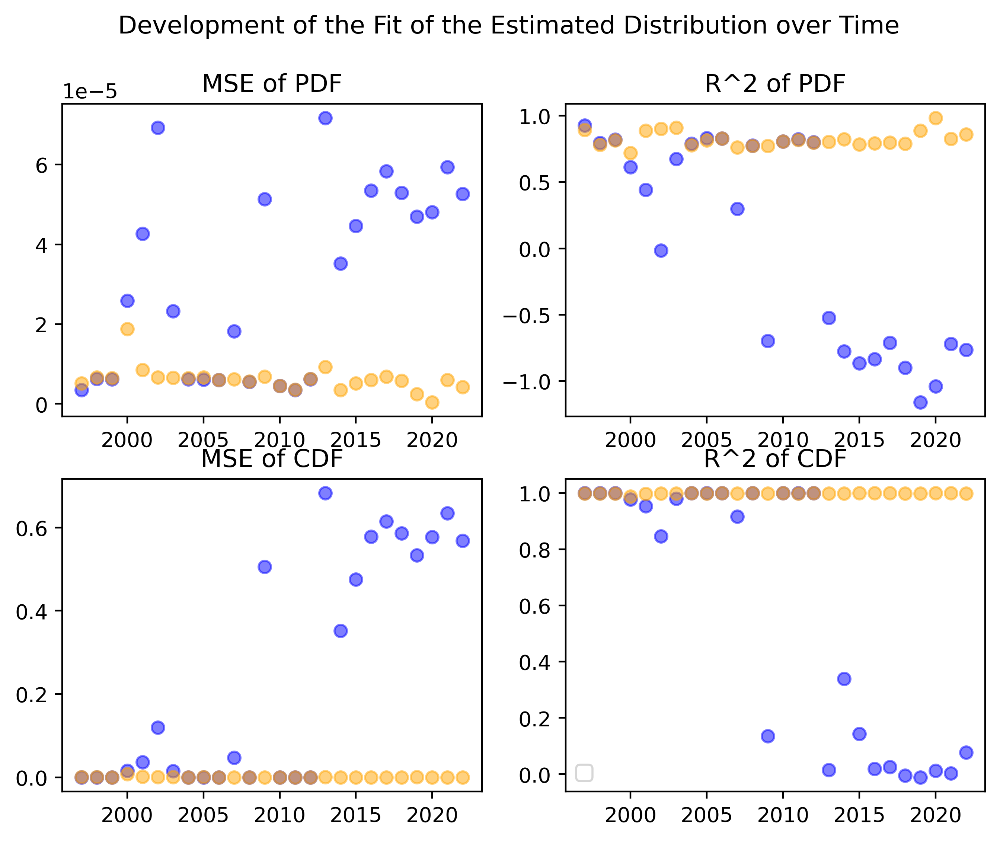

In [21]:
# how does the goodness of fit develop over time (yearly)?

figure, axis = plt.subplots(2, 2)

for y in range(1997, 2023):
    fit1= mle_weibull_fit(df[(df['MESS_DATUM'].dt.year == y)]["FF_10_wind"], 200)
    fit2=weibull_fit(df[(df['MESS_DATUM'].dt.year == y)]["FF_10_wind"], 200)

    axis[0,0].scatter(y,fit1[0], color='blue', alpha=0.5 , label='MLM') 
    axis[0,0].scatter(y, fit2[0], color='orange', alpha=0.5, label='graphical method')
    axis[0, 0].set_title("MSE of PDF")

    axis[1,0].scatter(y, fit1[1], color='blue', alpha=0.5) 
    axis[1,0].scatter(y, fit2[1], color='orange', alpha=0.5)
    axis[1, 0].set_title("MSE of CDF")

    axis[0,1].scatter(y, fit1[2], color='blue', alpha=0.5) 
    axis[0,1].scatter(y, fit2[2], color='orange', alpha=0.5)
    axis[0, 1].set_title("R^2 of PDF")

    axis[1,1].scatter(y, fit1[3], color='blue', alpha=0.5) 
    axis[1,1].scatter(y, fit2[3], color='orange', alpha=0.5)
    axis[1, 1].set_title("R^2 of CDF")

figure.suptitle('Development of the Fit of the Estimated Distribution over Time')
#plt.xlabel('Year')
#plt.ylabel('Fit')
plt.legend()
plt.show()

C:\Users\gwend\AppData\Local\Temp\ipykernel_6852\3230708391.py:44: RuntimeWarning: invalid value encountered in log
  l_fn = lambda beta: - 1 / N * np.sum(np.log(X)) - 1 / beta + np.sum(X ** beta * np.log(X)) / np.sum(X ** beta)
C:\Users\gwend\AppData\Local\Temp\ipykernel_6852\3230708391.py:44: RuntimeWarning: invalid value encountered in power
  l_fn = lambda beta: - 1 / N * np.sum(np.log(X)) - 1 / beta + np.sum(X ** beta * np.log(X)) / np.sum(X ** beta)


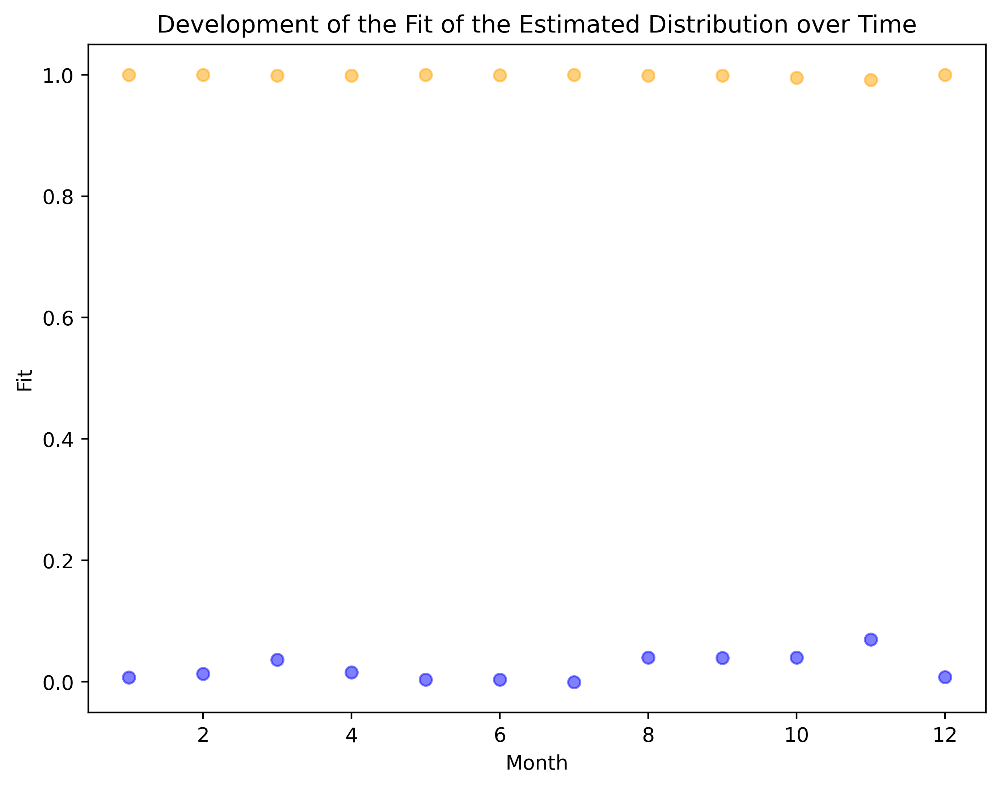

In [22]:
# how does the goodness of fit develop over time (monthly)?

for m in range(1,13):
    plt.scatter(m, mle_weibull_fit(df[(df['MESS_DATUM'].dt.month== m)]["FF_10_wind"], 200)[3], color='blue', alpha=0.5) 
    plt.scatter(m, weibull_fit(df[(df['MESS_DATUM'].dt.month== m)]["FF_10_wind"], 200)[3], color='orange', alpha=0.5) 
plt.title('Development of the Fit of the Estimated Distribution over Time')
plt.xlabel('Month')
plt.ylabel('Fit')
plt.show()

## Now classify each data point in df according to the Beaufort Scale:


In [23]:
def bf_classifier(data):
    if data >24.5:
        return 10
    elif data >20.8:
        return 9
    elif data >17.2:
        return 8
    elif data >13.9:
        return 7
    elif data >10.8:
        return 6
    elif data >8.0:
        return 5
    elif data >5.5:
        return 4
    elif data >3.4:
        return 3
    elif data >1.6:
        return 2
    elif data >0.3:
        return 1
    else:
        return 0
    
# Vectorize the scalar function to make it work on arrays
bf_classifier_vectorized = np.vectorize(bf_classifier)

# Add a new column to our dataframe that displays the beaufort classification of each wind measurement:
df['bf_classification']=bf_classifier_vectorized(df["FF_10_wind"])
#df



In [55]:
# Make a new dataframe with one frame for each day, that has min max and mean speed of the day as feature
from datetime import datetime

df=df[df['FF_10_wind']>-1]
df['YEAR'] = df["MESS_DATUM"].dt.year
df['MONTH'] = df["MESS_DATUM"].dt.month
df['DAY'] = df["MESS_DATUM"].dt.day

daily_df = (df.groupby(['YEAR', 'MONTH', 'DAY'])['FF_10_wind']
      .agg([('Count','size'), ('Min','min'), ('Max','max'), ('Mean','mean')]).reset_index())


def make_date( y, m, d):
    return(datetime(y,m,d))

make_date_vectorized=np.vectorize(make_date)

# add a column for the date
daily_df['DATE']=make_date_vectorized(daily_df['YEAR'], daily_df['MONTH'], daily_df['DAY'])
#add a column for the beaufort classification based on the max windspeed
daily_df['bf_classification']=bf_classifier_vectorized(daily_df["Max"])

daily_df

,YEAR,MONTH,DAY,Count,Min,Max,Mean,DATE,bf_classification
0,1996,12,19,64,9.4,20.9,17.642187,1996-12-19,9
1,1996,12,20,131,13.4,20.7,15.690840,1996-12-20,8
2,1996,12,21,122,0.8,14.0,6.729508,1996-12-21,7
3,1996,12,22,127,1.3,8.8,3.934646,1996-12-22,5
4,1996,12,23,122,8.6,15.1,12.627049,1996-12-23,7
...,...,...,...,...,...,...,...,...,...
9020,2022,12,27,144,6.4,13.2,9.678472,2022-12-27,6
9021,2022,12,28,144,6.8,14.5,10.448611,2022-12-28,7
9022,2022,12,29,144,8.7,13.5,11.094444,2022-12-29,6
9023,2022,12,30,144,7.3,12.8,9.769444,2022-12-30,6


## Now analyze the frequency of each Beaufort class per year

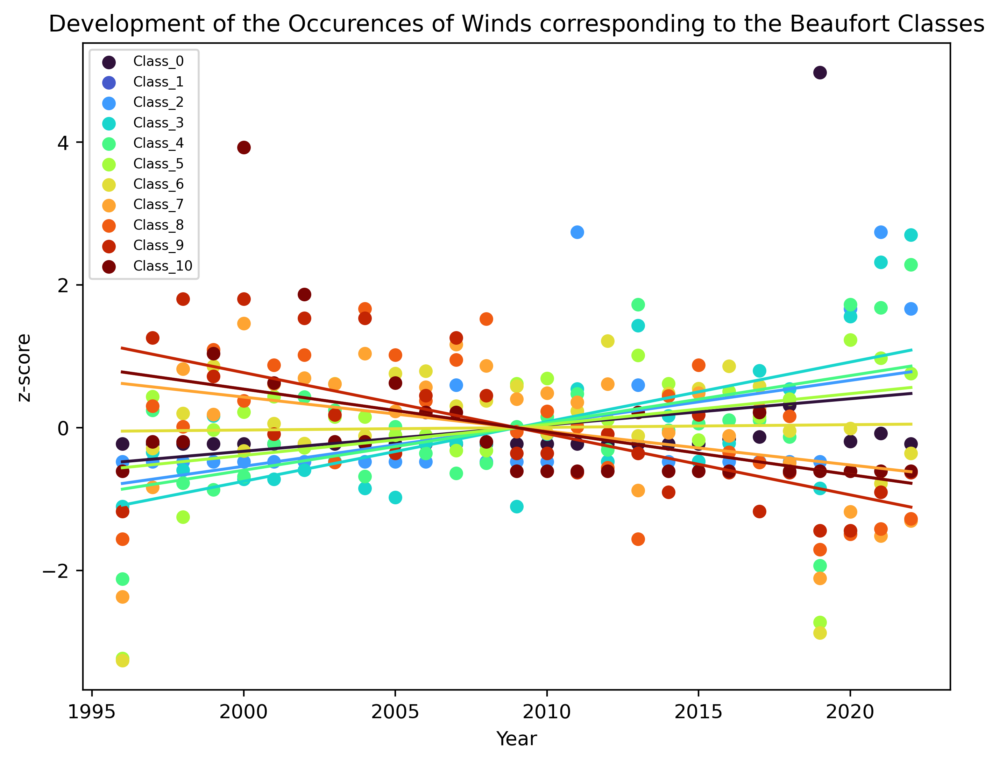

In [25]:
# First count the occurences and save them in a dataframe

for n in range(0,11):
    yearly_df[f'Class_{n}']=0
for y in year_arr:
    for n in range(0,11):
        yearly_df.loc[y-1996, f'Class_{n}']=len(daily_df[(daily_df['YEAR']==y) &(daily_df['bf_classification']==n)])

#compute the z-scores
for n in range(0,11):
    yearly_df[f'z_Class_{n}']= (yearly_df[f'Class_{n}']- yearly_df[f'Class_{n}'].mean())/yearly_df[f'Class_{n}'].std()

#print(yearly_df)


# now plot their z-scores and the corresponding linear regressions:

from matplotlib.colors import to_hex
class_colors = plt.cm.turbo(np.linspace(0,1,11))
class_colors= [to_hex(color) for color in class_colors]
for n in range(0,11):  
    plt.scatter(yearly_df['YEAR'], yearly_df[f'z_Class_{n}'],color=class_colors[n], label=f'Class_{n}')
    if n !=1 : # HERE IS AN ISSUE WITH CONVERGENCE
        pol=np.polyfit(year_arr, yearly_df[f'z_Class_{n}'] , 1)
        model = np.poly1d(pol)
        plt.plot(year_arr,model(year_arr),color=class_colors[n])

plt.legend(loc='best', fontsize=7)
plt.title('Development of the Occurences of Winds corresponding to the Beaufort Classes')
plt.ylabel('z-score')
plt.xlabel('Year')
plt.show()


['#30123b', '#4559cb', '#3e9bfe', '#19d5cd', '#46f884', '#a4fc3c', '#e1dd37', '#fea431', '#f05b12', '#c32503', '#7a0403']


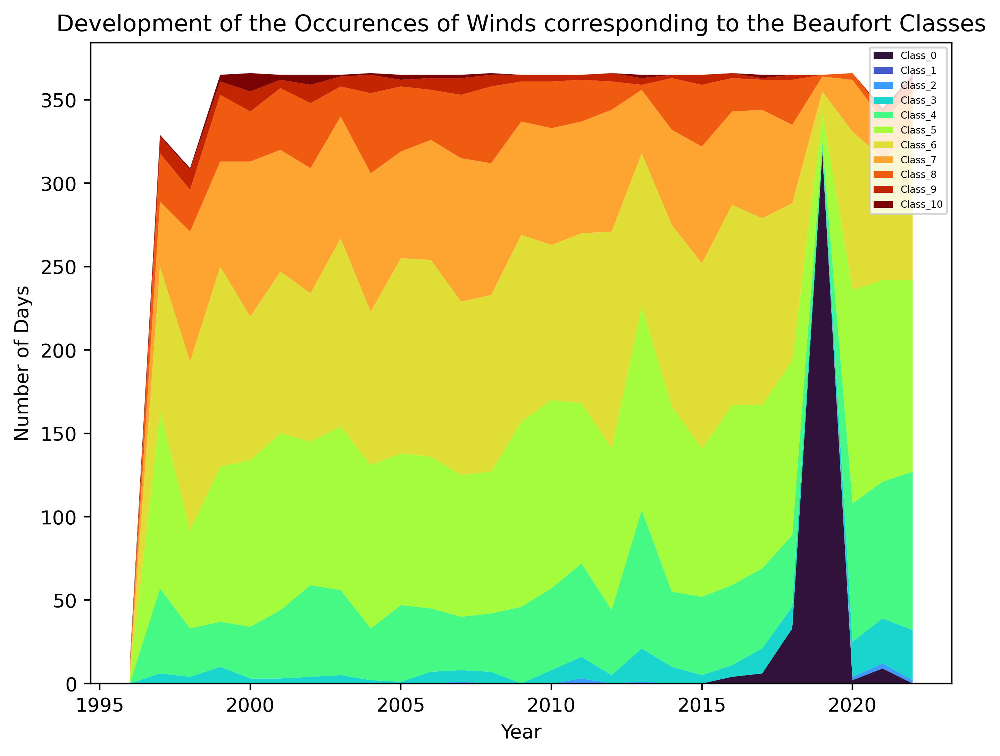

In [26]:
# Make a stackplot:
mylabels=[]
for n in range(0,11):
    mylabels=np.append(mylabels, f'Class_{n}')
print(class_colors)
plt.stackplot(year_arr,[yearly_df[f'Class_0'], yearly_df[f'Class_1'], yearly_df[f'Class_2'], yearly_df[f'Class_3'], yearly_df[f'Class_4'],
              yearly_df[f'Class_5'],yearly_df[f'Class_6'],yearly_df[f'Class_7'],yearly_df[f'Class_8'],yearly_df[f'Class_9'], yearly_df[f'Class_10']], 
              colors=class_colors, labels=mylabels)
plt.legend(loc='best', fontsize=5)

plt.title('Development of the Occurences of Winds corresponding to the Beaufort Classes')
plt.ylabel('Number of Days')
plt.xlabel('Year')
plt.show()


['#30123b', '#4559cb', '#3e9bfe', '#19d5cd', '#46f884', '#a4fc3c', '#e1dd37', '#fea431', '#f05b12', '#c32503', '#7a0403']


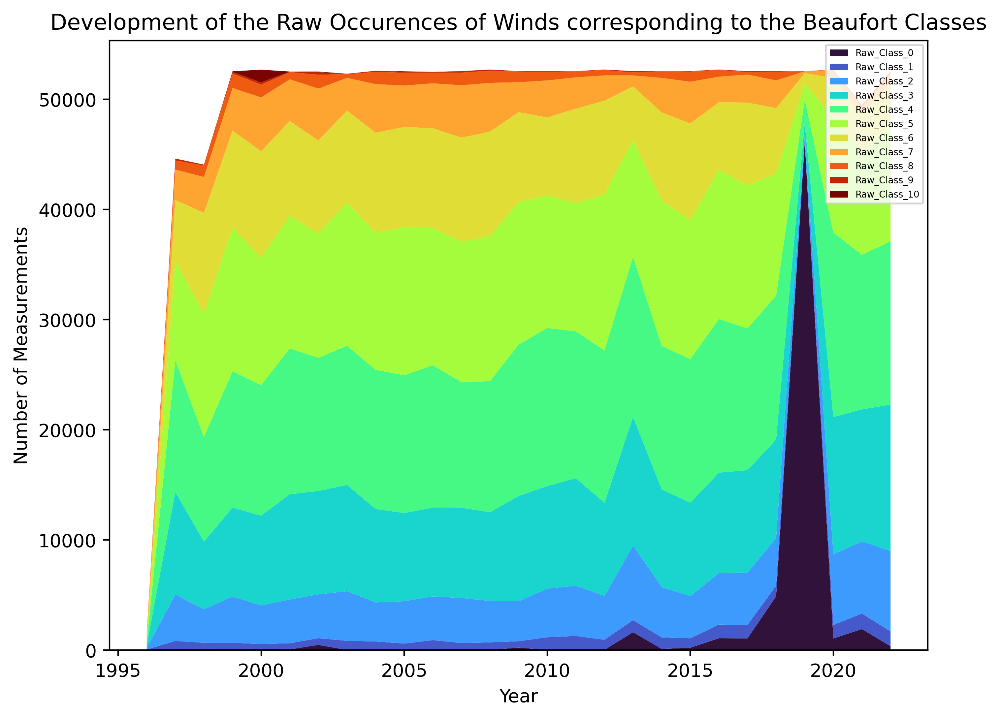

In [27]:
# Now do the plot for raw measurements, rather than the classified days: 



for n in range(0,11):
    yearly_df[f'Raw_Class_{n}']=0
for y in year_arr:
    for n in range(0,11):
        yearly_df.loc[y-1996, f'Raw_Class_{n}']=len(df[(df['YEAR']==y) &(df['bf_classification']==n)])



# Make a stackplot:
my_raw_labels=[] 
for n in range(0,11):
    my_raw_labels=np.append(my_raw_labels, f'Raw_Class_{n}')
print(class_colors)
plt.stackplot(year_arr,[yearly_df[f'Raw_Class_0'], yearly_df[f'Raw_Class_1'], yearly_df[f'Raw_Class_2'], yearly_df[f'Raw_Class_3'], yearly_df[f'Raw_Class_4'],
              yearly_df[f'Raw_Class_5'],yearly_df[f'Raw_Class_6'],yearly_df[f'Raw_Class_7'],yearly_df[f'Raw_Class_8'],yearly_df[f'Raw_Class_9'], yearly_df[f'Raw_Class_10']], 
              colors=class_colors, labels=my_raw_labels)
plt.legend(loc='best', fontsize=5)

plt.title('Development of the Raw Occurences of Winds corresponding to the Beaufort Classes')
plt.ylabel('Number of Measurements')
plt.xlabel('Year')
plt.show()


# Load the data that starts in the 1950s
Maybe I don't have the exact same station on Helgoland for the two sets, as the data doesn't fit perfectly...

In [28]:
# contains the daily average windspeed starting in the 1950s
early_df = pd.read_csv(
    "FG_STAID000468.csv",
    skiprows=19,
    sep=",",
    index_col=None,
    skipfooter=0,
    engine="python",
)
    
column_headers = list(early_df.columns.values)
#print("The column headers are :", column_headers)
early_df=early_df.rename(columns={' SOUID': "SOUID", '    DATE': "DATE", '   FG': "FG", ' Q_FG' : "Q_FG"}) 

# convert the date and divide the windspeed by 10, so it's given in m/s
early_df['DATE']=pd.to_datetime(early_df["DATE"], format="%Y%m%d")
early_df['FG']=early_df['FG']/10
early_df['YEAR']=early_df['DATE'].dt.year

# classify the winspeeds again by the bf-scale (even though this does not really make sense for the daily averages): SHOULD CHANGE THIS
early_df['bf_classification']=bf_classifier_vectorized(early_df["FG"])

# make a dataframe that contains for each year how often each class for the daily mean occured

early_yearly_df=pd.DataFrame()
early_year_arr=np.linspace(1952, 2023,72)
early_yearly_df['YEAR']=early_year_arr

for n in range(0,11): 
    early_yearly_df[f'Class_{n}']=0
for y in early_year_arr:
    for n in range(0,11):
        early_yearly_df.loc[y-1952, f'Class_{n}']=len(early_df[(early_df['YEAR']==y) &(early_df['bf_classification']==n)])

#proper measurement starts not until 1959
early_yearly_df=early_yearly_df[7:]


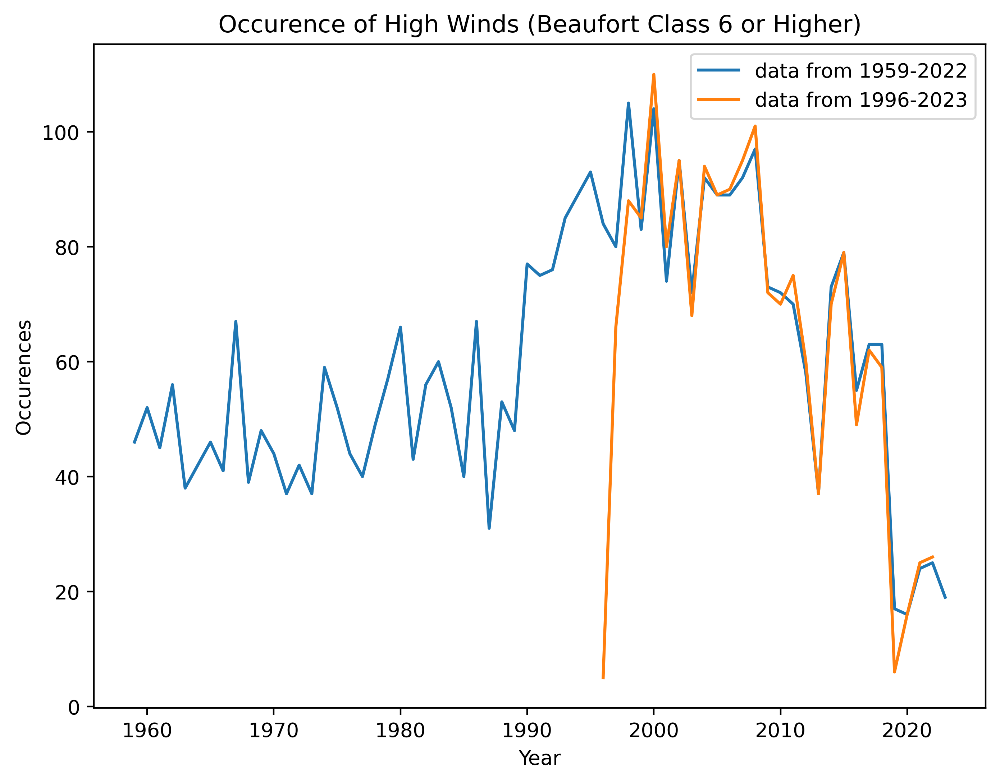

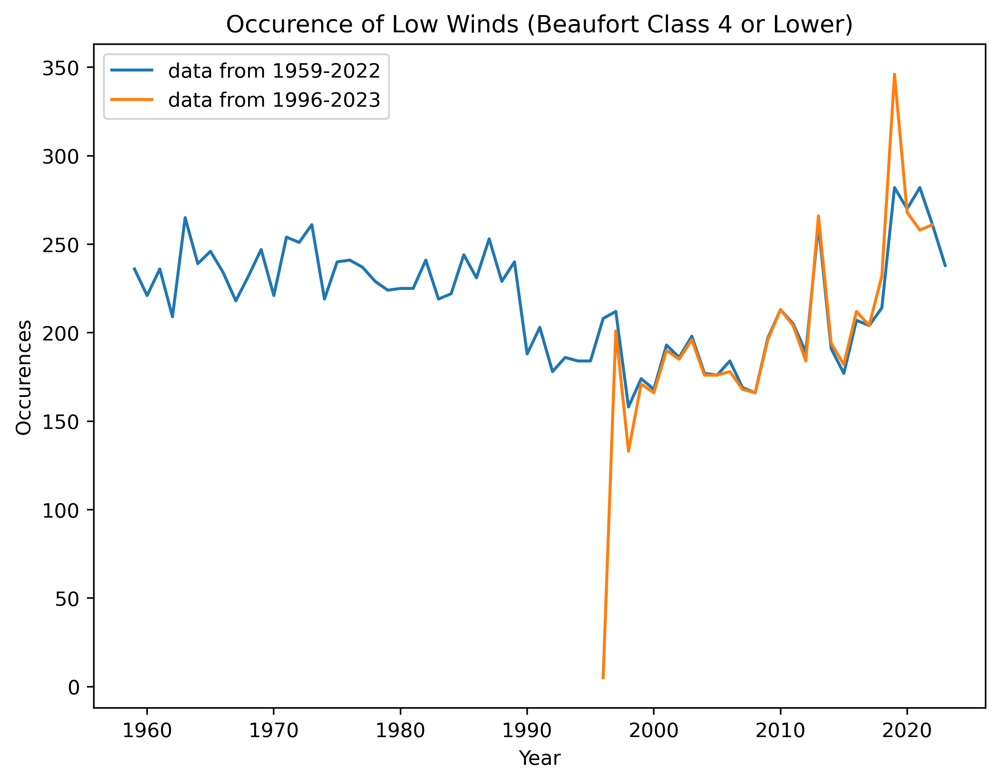

In [29]:
# Crosscheck with the other dataset that starts in 1996:
# do the classification of the mean in addition to the one by the max


daily_df['mean_bf_classification']=bf_classifier_vectorized(daily_df["Mean"])

for n in range(0,11):
    yearly_df[f'mean_Class_{n}']=0
for y in year_arr:
    for n in range(0,11):
        yearly_df.loc[y-1996, f'mean_Class_{n}']=len(daily_df[(daily_df['YEAR']==y) &(daily_df['mean_bf_classification']==n)])

yearly_df 



# for each year, plot how many days had an average of more than a class 6
plt.plot(early_yearly_df['YEAR'], early_yearly_df['Class_6'] +early_yearly_df['Class_7'] 
         +early_yearly_df['Class_8']+early_yearly_df['Class_9'] +early_yearly_df['Class_10'], label='data from 1959-2022')
plt.plot(yearly_df['YEAR'], yearly_df['mean_Class_6'] +yearly_df['mean_Class_7'] 
         +yearly_df['mean_Class_8']+yearly_df['mean_Class_9']+ yearly_df['mean_Class_10'], label='data from 1996-2023')
plt.title('Occurence of High Winds (Beaufort Class 6 or Higher)')
plt.ylabel('Occurences')
plt.xlabel('Year')
plt.legend()
plt.show()


# for each year, plot how many days had an average of less than a class 5
plt.plot(early_yearly_df['YEAR'], early_yearly_df['Class_0'] +early_yearly_df['Class_1'] 
         +early_yearly_df['Class_2']+early_yearly_df['Class_3']+early_yearly_df['Class_4'], label='data from 1959-2022')
plt.plot(yearly_df['YEAR'], yearly_df['mean_Class_0'] +yearly_df['mean_Class_1'] 
         +yearly_df['mean_Class_2']+yearly_df['mean_Class_3']+yearly_df['mean_Class_4'], label='data from 1996-2023')
plt.title('Occurence of Low Winds (Beaufort Class 4 or Lower)')
plt.ylabel('Occurences')
plt.xlabel('Year')
plt.legend()
plt.show()

# Plot how the mean has developed over time
Again the empiric means based on thw two datasets should perfectly coincide, but they do not!

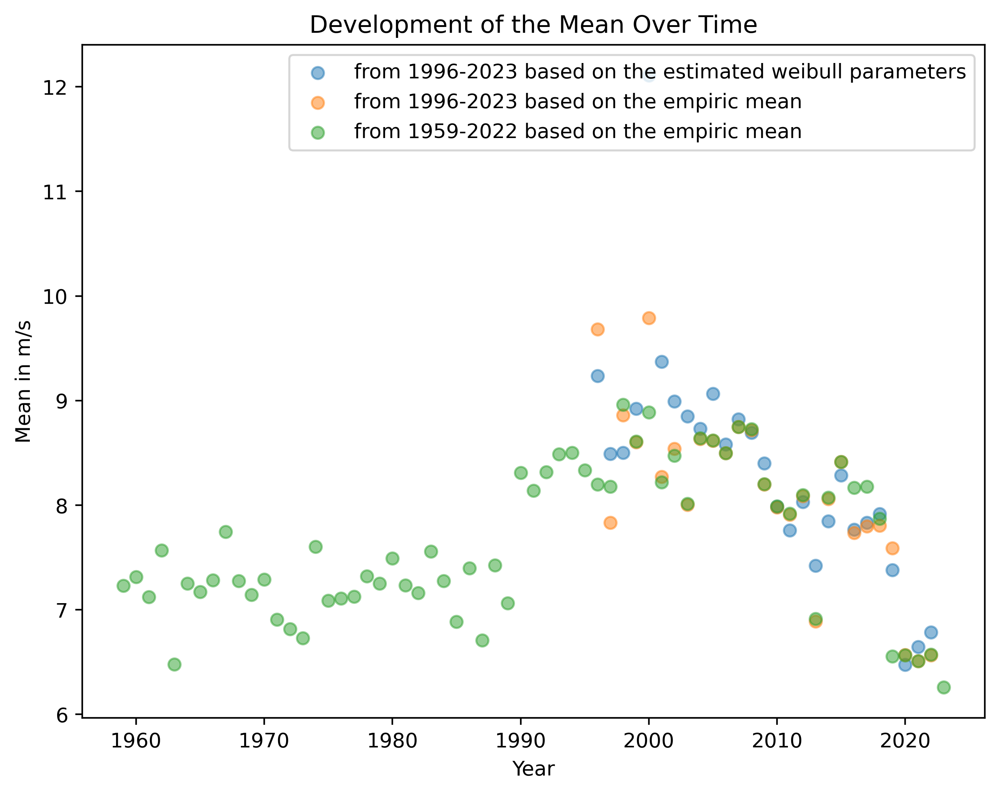

,YEAR,MONTH,DAY,Count,Min,Max,Mean,DATE,bf_classification
0,1996,12,19,64,9.4,20.9,17.642187,1996-12-19,9
1,1996,12,20,131,13.4,20.7,15.690840,1996-12-20,8
2,1996,12,21,122,0.8,14.0,6.729508,1996-12-21,7
3,1996,12,22,127,1.3,8.8,3.934646,1996-12-22,5
4,1996,12,23,122,8.6,15.1,12.627049,1996-12-23,7
...,...,...,...,...,...,...,...,...,...
9020,2022,12,27,144,6.4,13.2,9.678472,2022-12-27,6
9021,2022,12,28,144,6.8,14.5,10.448611,2022-12-28,7
9022,2022,12,29,144,8.7,13.5,11.094444,2022-12-29,6
9023,2022,12,30,144,7.3,12.8,9.769444,2022-12-30,6


In [61]:

import scipy

# first plot the mean of the recent years, based on their weibull parameters: mean= a* scipy.special.gamma(1 + 1 / k)
#then plot the mean from the data going back to 1959:

# first drop the data points that are nor properly recorded
early_df=early_df[early_df['Q_FG'] != 9] # drop the invalid measurements

early_yearly_df['Mean']=0.0
for y in early_yearly_df['YEAR']:
    early_yearly_df.loc[y-1952, 'Mean']=early_df[early_df['YEAR']==y]['FG'].mean() 

# also plot the empiric mean for the recent data

df=df[df['FF_10_wind']>=0]
yearly_df['Mean']=0.0
for y in yearly_df['YEAR']:
   yearly_df.loc[y-1996, 'Mean']=df[df['YEAR']==y]['FF_10_wind'].mean() 


plt.scatter(yearly_df['YEAR'], yearly_df['parameter_a']*scipy.special.gamma(1+ 1/yearly_df['parameter_k']), alpha=0.5, label='from 1996-2023 based on the estimated weibull parameters')

plt.scatter(yearly_df['YEAR'], yearly_df['Mean'], label='from 1996-2023 based on the empiric mean', alpha=0.5)
plt.scatter(early_yearly_df['YEAR'], early_yearly_df['Mean'], label='from 1959-2022 based on the empiric mean', alpha=0.5)

#plt.scatter(early_yearly_df['YEAR'], early_yearly_df['Mean']+1, label='from 1959-2022 based on the empiric mean+1', alpha=0.5)

plt.title('Development of the Mean Over Time')
plt.ylabel('Mean in m/s')
plt.xlabel('Year')
plt.legend(loc='best')
plt.show()

daily_df

In [31]:
#mask=(df['MESS_DATUM'].dt.year == 2000) &( df['MESS_DATUM'].dt.month == 11) 
#plt.plot(df[mask]["MESS_DATUM"], df[mask]["FF_10_wind"])

# Check how the weibull parameters differ if we use the daily mean

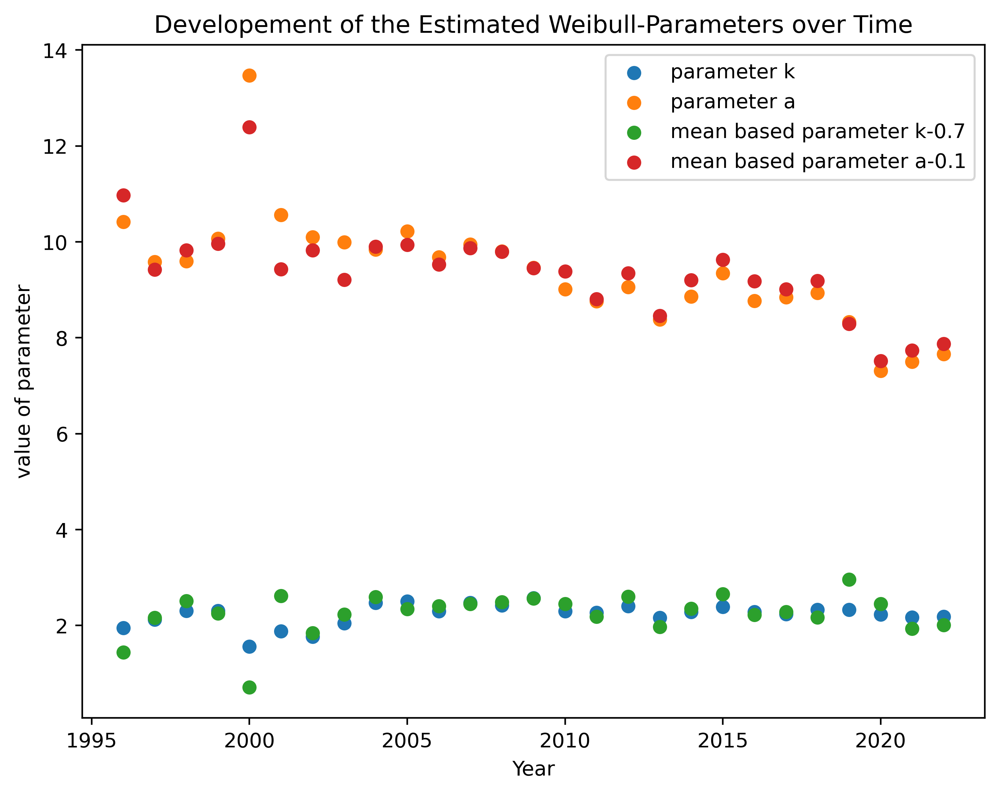

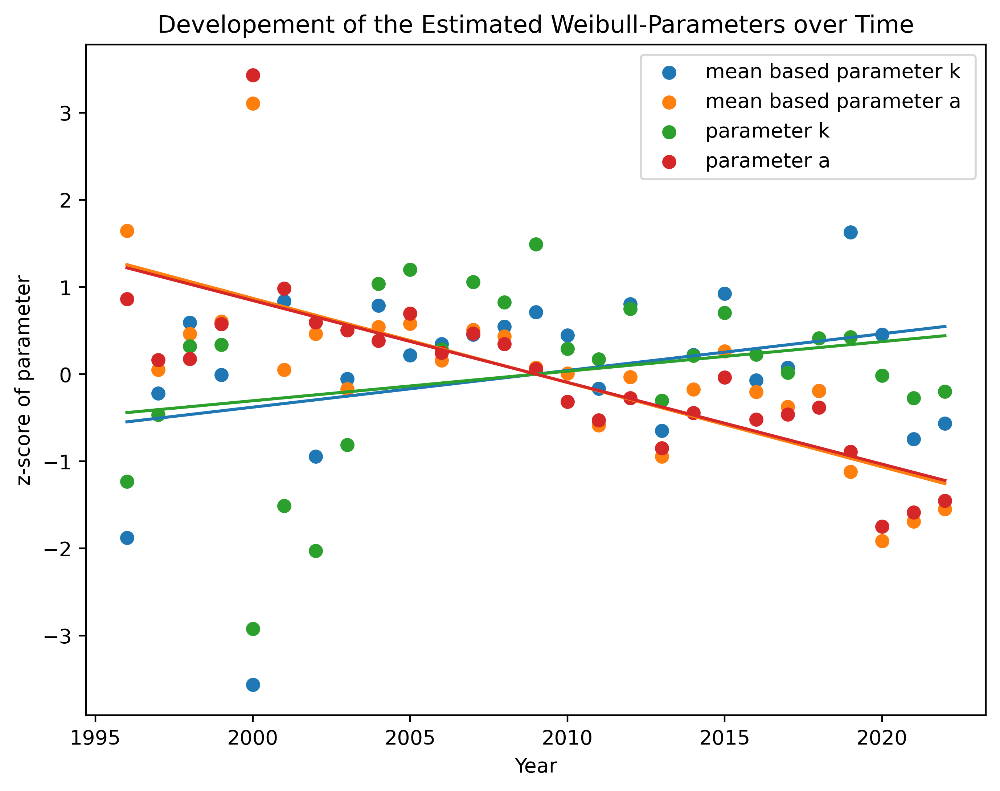

In [32]:
yearly_df['mean_based_parameter_k']=0.0
yearly_df['mean_based_parameter_a']=0.0

for y in year_arr:
    yearly_df.loc[y-1996, 'mean_based_parameter_k' ], yearly_df.loc[y-1996, 'mean_based_parameter_a' ]=get_weibull_parameters(daily_df[(daily_df['DATE'].dt.year == y)]["Mean"])

(yearly_df['parameter_k']-yearly_df['parameter_k'].mean())/yearly_df['parameter_k'].std()

#plot the parameters:

plt.scatter(year_arr, yearly_df['parameter_k'], label='parameter k' )
plt.scatter(year_arr, yearly_df['parameter_a'], label='parameter a ' )
plt.scatter(year_arr, yearly_df['mean_based_parameter_k']-0.7, label='mean based parameter k-0.7' )
plt.scatter(year_arr, yearly_df['mean_based_parameter_a']-0.1, label='mean based parameter a-0.1' )
plt.title('Developement of the Estimated Weibull-Parameters over Time')
plt.xlabel('Year')
plt.ylabel('value of parameter')
plt.legend()
plt.show()

# plot the z-scores of the parameters and do linear regression: 
plt.scatter(year_arr,(yearly_df['mean_based_parameter_k']-yearly_df['mean_based_parameter_k'].mean())/yearly_df['mean_based_parameter_k'].std(), label='mean based parameter k ')

plt.scatter(year_arr,(yearly_df['mean_based_parameter_a']-yearly_df['mean_based_parameter_a'].mean())/yearly_df['mean_based_parameter_a'].std(), label='mean based parameter a ')

plt.scatter(year_arr, yearly_df['z_parameter_k'], label='parameter k')
plt.scatter(year_arr, yearly_df['z_parameter_a'], label='parameter a')


k_pol=np.polyfit(year_arr, yearly_df['z_parameter_k'], 1)
k_model = np.poly1d(k_pol)
plt.plot(year_arr,k_model(year_arr))

a_pol=np.polyfit(year_arr, yearly_df['z_parameter_a'], 1)
a_model = np.poly1d(a_pol)
plt.plot(year_arr,a_model(year_arr))

m_k_pol=np.polyfit(year_arr,(yearly_df['mean_based_parameter_k']-yearly_df['mean_based_parameter_k'].mean())/yearly_df['mean_based_parameter_k'].std(), 1)
m_k_model = np.poly1d(m_k_pol)
plt.plot(year_arr,m_k_model(year_arr))

m_a_pol=np.polyfit(year_arr, (yearly_df['mean_based_parameter_a']-yearly_df['mean_based_parameter_a'].mean())/yearly_df['mean_based_parameter_a'].std(), 1)
m_a_model = np.poly1d(m_a_pol)
plt.plot(year_arr,m_a_model(year_arr))

plt.title('Developement of the Estimated Weibull-Parameters over Time')
plt.xlabel('Year')
plt.ylabel('z-score of parameter')
plt.legend()
plt.show()


# Hypothesis: The wind development in the past ~30 years is different from that in the ~30 years before

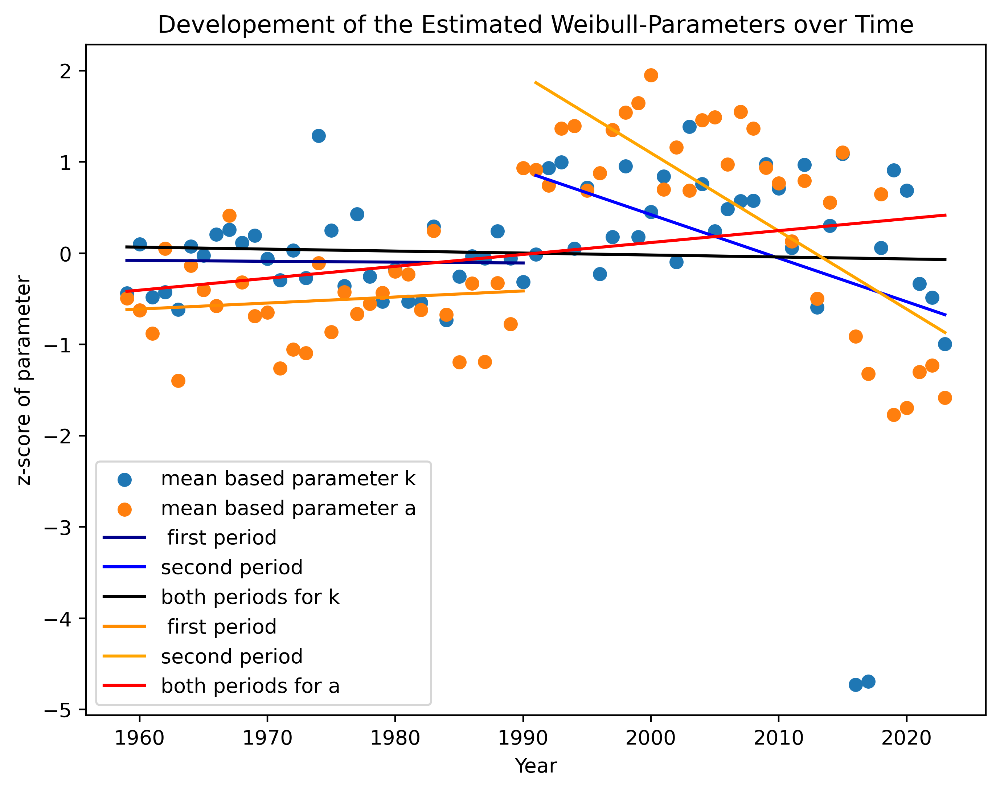

In [33]:
early_yearly_df['mean_based_parameter_k']=0.0
early_yearly_df['mean_based_parameter_a']=0.0

for y in early_yearly_df['YEAR']:
    early_yearly_df.loc[y-1952, 'mean_based_parameter_k' ], early_yearly_df.loc[y-1952, 'mean_based_parameter_a' ]=get_weibull_parameters(early_df[(early_df['DATE'].dt.year == y)]["FG"])

# plot the z-scores of the parameters and do linear regression: 
plt.scatter(early_yearly_df['YEAR'],(early_yearly_df['mean_based_parameter_k']-early_yearly_df['mean_based_parameter_k'].mean())/early_yearly_df['mean_based_parameter_k'].std(), label='mean based parameter k ')

plt.scatter(early_yearly_df['YEAR'],(early_yearly_df['mean_based_parameter_a']-early_yearly_df['mean_based_parameter_a'].mean())/early_yearly_df['mean_based_parameter_a'].std(), label='mean based parameter a ')

m_k_pol=np.polyfit(early_yearly_df['YEAR'][0:32],((early_yearly_df['mean_based_parameter_k']-early_yearly_df['mean_based_parameter_k'].mean())/early_yearly_df['mean_based_parameter_k'].std())[0:32], 1)
m_k_model = np.poly1d(m_k_pol)
plt.plot(early_yearly_df['YEAR'][0:32],m_k_model(early_yearly_df['YEAR'][0:32]), label=' first period', color='darkblue')

m_k_pol=np.polyfit(early_yearly_df['YEAR'][32:],((early_yearly_df['mean_based_parameter_k']-early_yearly_df['mean_based_parameter_k'].mean())/early_yearly_df['mean_based_parameter_k'].std())[32:], 1)
m_k_model = np.poly1d(m_k_pol)
plt.plot(early_yearly_df['YEAR'][32:],m_k_model(early_yearly_df['YEAR'][32:]), label='second period', color='blue')


m_k_pol=np.polyfit(early_yearly_df['YEAR'],((early_yearly_df['mean_based_parameter_k']-early_yearly_df['mean_based_parameter_k'].mean())/early_yearly_df['mean_based_parameter_k'].std()), 1)
m_k_model = np.poly1d(m_k_pol)
plt.plot(early_yearly_df['YEAR'],m_k_model(early_yearly_df['YEAR']), label='both periods for k', color='black')


m_a_pol=np.polyfit(early_yearly_df['YEAR'][0:32], ((early_yearly_df['mean_based_parameter_a']-early_yearly_df['mean_based_parameter_a'].mean())/early_yearly_df['mean_based_parameter_a'].std())[0:32], 1)
m_a_model = np.poly1d(m_a_pol)
plt.plot(early_yearly_df['YEAR'][0:32],m_a_model(early_yearly_df['YEAR'][0:32]),label=' first period', color='darkorange')

m_a_pol=np.polyfit(early_yearly_df['YEAR'][32:], ((early_yearly_df['mean_based_parameter_a']-early_yearly_df['mean_based_parameter_a'].mean())/early_yearly_df['mean_based_parameter_a'].std())[32:], 1)
m_a_model = np.poly1d(m_a_pol)
plt.plot(early_yearly_df['YEAR'][32:],m_a_model(early_yearly_df['YEAR'][32:]), label='second period', color='orange')

m_a_pol=np.polyfit(early_yearly_df['YEAR'], ((early_yearly_df['mean_based_parameter_a']-early_yearly_df['mean_based_parameter_a'].mean())/early_yearly_df['mean_based_parameter_a'].std()), 1)
m_a_model = np.poly1d(m_a_pol)
plt.plot(early_yearly_df['YEAR'],m_a_model(early_yearly_df['YEAR']), label='both periods for a', color='red')

plt.title('Developement of the Estimated Weibull-Parameters over Time')
plt.xlabel('Year')
plt.ylabel('z-score of parameter')
plt.legend()
plt.show()



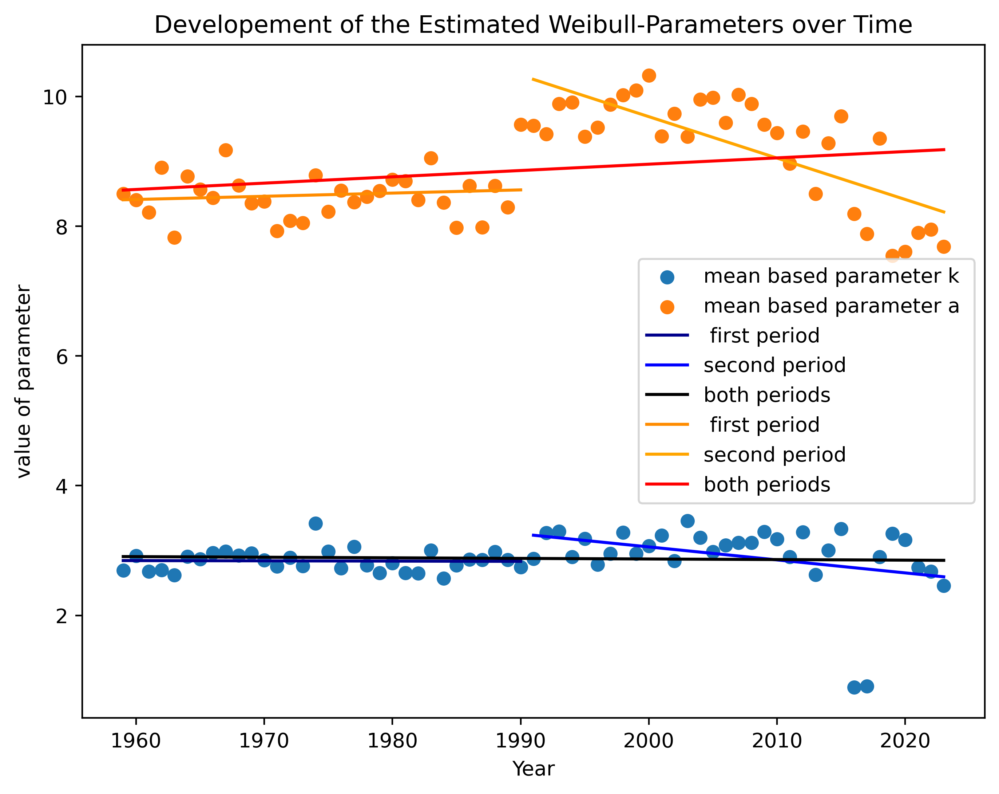

In [34]:
# plot the z-scores of the parameters and do linear regression: 
plt.scatter(early_yearly_df['YEAR'],early_yearly_df['mean_based_parameter_k'], label='mean based parameter k ')

plt.scatter(early_yearly_df['YEAR'],early_yearly_df['mean_based_parameter_a'], label='mean based parameter a ')

m_k_pol=np.polyfit(early_yearly_df['YEAR'][0:32],(early_yearly_df['mean_based_parameter_k'])[0:32], 1)
m_k_model = np.poly1d(m_k_pol)
plt.plot(early_yearly_df['YEAR'][0:32],m_k_model(early_yearly_df['YEAR'][0:32]), label=' first period', color='darkblue')

m_k_pol=np.polyfit(early_yearly_df['YEAR'][32:],(early_yearly_df['mean_based_parameter_k'])[32:], 1)
m_k_model = np.poly1d(m_k_pol)
plt.plot(early_yearly_df['YEAR'][32:],m_k_model(early_yearly_df['YEAR'][32:]), label='second period', color='blue')

m_k_pol=np.polyfit(early_yearly_df['YEAR'],(early_yearly_df['mean_based_parameter_k']), 1)
m_k_model = np.poly1d(m_k_pol)
plt.plot(early_yearly_df['YEAR'],m_k_model(early_yearly_df['YEAR']), label='both periods', color='black')

m_a_pol=np.polyfit(early_yearly_df['YEAR'][0:32], (early_yearly_df['mean_based_parameter_a'])[0:32], 1)
m_a_model = np.poly1d(m_a_pol)
plt.plot(early_yearly_df['YEAR'][0:32],m_a_model(early_yearly_df['YEAR'][0:32]),label=' first period', color='darkorange')

m_a_pol=np.polyfit(early_yearly_df['YEAR'][32:], (early_yearly_df['mean_based_parameter_a'])[32:], 1)
m_a_model = np.poly1d(m_a_pol)
plt.plot(early_yearly_df['YEAR'][32:],m_a_model(early_yearly_df['YEAR'][32:]),label='second period', color='orange')

m_a_pol=np.polyfit(early_yearly_df['YEAR'], (early_yearly_df['mean_based_parameter_a']), 1)
m_a_model = np.poly1d(m_a_pol)
plt.plot(early_yearly_df['YEAR'],m_a_model(early_yearly_df['YEAR']),label='both periods', color='red')

plt.title('Developement of the Estimated Weibull-Parameters over Time')
plt.xlabel('Year')
plt.ylabel('value of parameter')
plt.legend()
plt.show()

In [35]:
# write a function that evaluates the goodnes of fit, when the paramters are computed based on the daily mean: 
# write a function that outputs all these measures of fit:

def mean_weibull_fit(dataframe, dataframe2, n_bins):
    params=get_weibull_parameters(dataframe2) ## add a bias
    params[0]=params[0]-0.7
    params[1]=params[1]-0.1
    max_included_windspeed=int(dataframe.max()+1)
    number_of_bins=n_bins
    edges=np.linspace(0,max_included_windspeed, number_of_bins)
    empiric_pdf= np.histogram(dataframe, bins=edges)[0]
    empiric_pdf=empiric_pdf/(empiric_pdf.sum())

    # first do mse
    mse=0
    for i in range(0, len(edges)-1):
        mse=mse + (empiric_pdf[i] - (weibull_cdf(params[0], params[1],edges[i+1]) -weibull_cdf(params[0], params[1],edges[i])))**2
    mse=1/len(empiric_pdf)*mse

    # do the mse for the cdf
    cdf_mse=0
    F_i=0
    for i in range(0, len(edges)-1):
        F_i=F_i+empiric_pdf[i]
        cdf_mse=cdf_mse + (F_i - weibull_cdf(params[0], params[1],edges[i+1]))**2
    cdf_mse=1/len(empiric_pdf)*cdf_mse

    # then do r^2
    enum=0
    for i in range(0, number_of_bins-1):
        enum=enum+(empiric_pdf[i] - (weibull_cdf(params[0], params[1],edges[i+1]) -weibull_cdf(params[0], params[1],edges[i])))**2

    denom=0
    for i in range(0, number_of_bins-1):
        denom=denom+(empiric_pdf[i] - 1/number_of_bins)**2   
    r2=1-enum/denom

    # then do r^2 for the cdf
    cdf_enum=0
    F_i=0
    for i in range(0, number_of_bins-1):
        F_i=F_i+empiric_pdf[i]
        cdf_enum=cdf_enum+(F_i- weibull_cdf(params[0], params[1],edges[i+1]))**2

    mean_F_i= 1/number_of_bins*F_i
    F_i=0
    cdf_denom=0
    for i in range(0, number_of_bins-1):
        F_i=F_i+empiric_pdf[i]
        cdf_denom=cdf_denom+(F_i - mean_F_i)**2   

    cdf_r2=1-cdf_enum/cdf_denom

    return [mse,cdf_mse, r2, cdf_r2]

df1=df[(df['MESS_DATUM'].dt.year == 2022)&(df['MESS_DATUM'].dt.month == 3) ]["FF_10_wind"]
df2= daily_df[(daily_df['DATE'].dt.year == 2022)&(daily_df['DATE'].dt.month == 3)]["Mean"]
n_bins=50
print('goodness of fit for the graphical estimator')
print(weibull_fit(df1 ,n_bins))
print('goodness of fit for the mle estimator')
print(mle_weibull_fit(df1 , n_bins))

print('goodness of fit for the graphical estimator, based on the daily mean, adapted')
print(mean_weibull_fit(df1, df2 , n_bins))   






goodness of fit for the graphical estimator
[9.809702271411361e-05, 0.0027417434805359236, 0.7468958510503001, 0.9950882498361083]
goodness of fit for the mle estimator
[6.57894978272048e-05, 0.0007782761048276195, 0.8302538201805479, 0.9986057419986304]
goodness of fit for the graphical estimator, based on the daily mean, adapted
[0.00011806956897553526, 0.0020744467070428043, 0.6953638658381909, 0.9962836917364309]


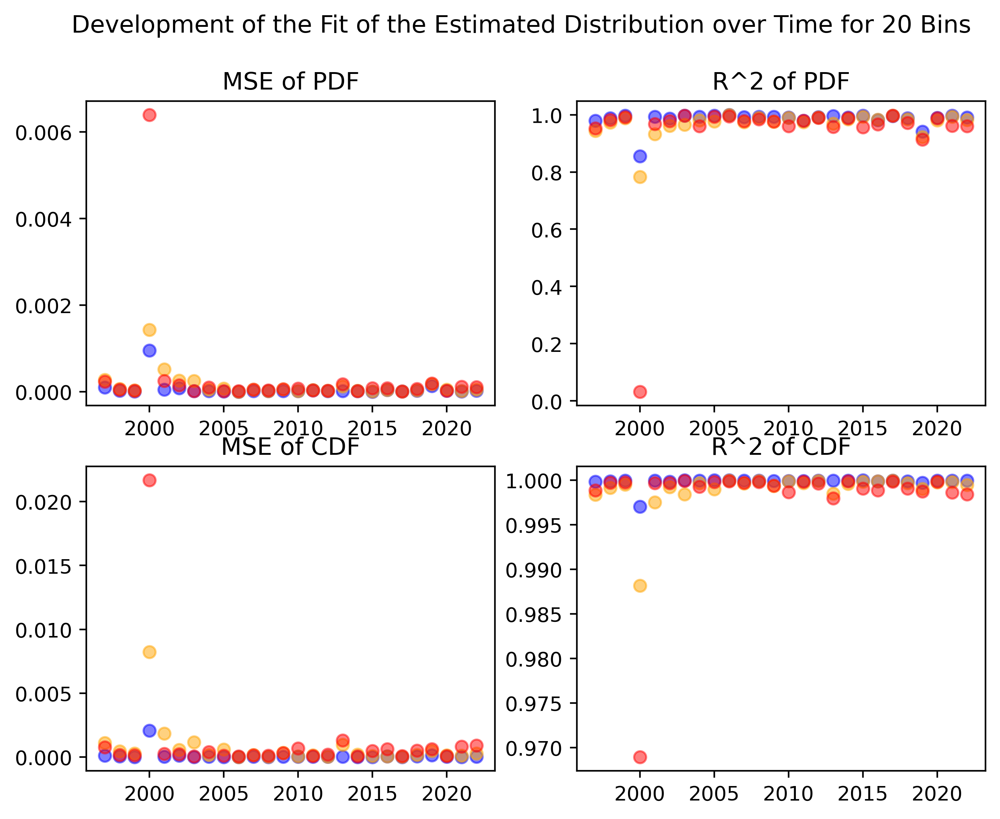

In [36]:
# how does the goodness of fit develop over time (yearly)?

figure, axis = plt.subplots(2, 2)
n_bins=20
for y in range(1997, 2023):
    fit1= mle_weibull_fit(df[(df['MESS_DATUM'].dt.year == y)]["FF_10_wind"], n_bins)
    fit2=weibull_fit(df[(df['MESS_DATUM'].dt.year == y)]["FF_10_wind"], n_bins)
    fit3=mean_weibull_fit(df[(df['MESS_DATUM'].dt.year == y)]["FF_10_wind"], daily_df[(daily_df['DATE'].dt.year == y)]["Mean"] ,n_bins)

    axis[0,0].scatter(y,fit1[0], color='blue', alpha=0.5 , label='MLM') 
    axis[0,0].scatter(y, fit2[0], color='orange', alpha=0.5, label='graphical method')
    axis[0,0].scatter(y, fit3[0], color='red', alpha=0.5, label='mean based method')
    axis[0, 0].set_title("MSE of PDF")

    axis[1,0].scatter(y, fit1[1], color='blue', alpha=0.5) 
    axis[1,0].scatter(y, fit2[1], color='orange', alpha=0.5)
    
    axis[1,0].scatter(y, fit3[1], color='red', alpha=0.5)
    axis[1, 0].set_title("MSE of CDF")

    axis[0,1].scatter(y, fit1[2], color='blue', alpha=0.5) 
    axis[0,1].scatter(y, fit2[2], color='orange', alpha=0.5)
    axis[0,1].scatter(y, fit3[2], color='red', alpha=0.5)
    axis[0, 1].set_title("R^2 of PDF")

    axis[1,1].scatter(y, fit1[3], color='blue', alpha=0.5) 
    axis[1,1].scatter(y, fit2[3], color='orange', alpha=0.5)
    axis[1,1].scatter(y, fit3[3], color='red', alpha=0.5)
    axis[1, 1].set_title("R^2 of CDF")

figure.suptitle(f'Development of the Fit of the Estimated Distribution over Time for {n_bins} Bins')
#plt.xlabel('Year')
#plt.ylabel('Fit')
#plt.legend()
plt.show()

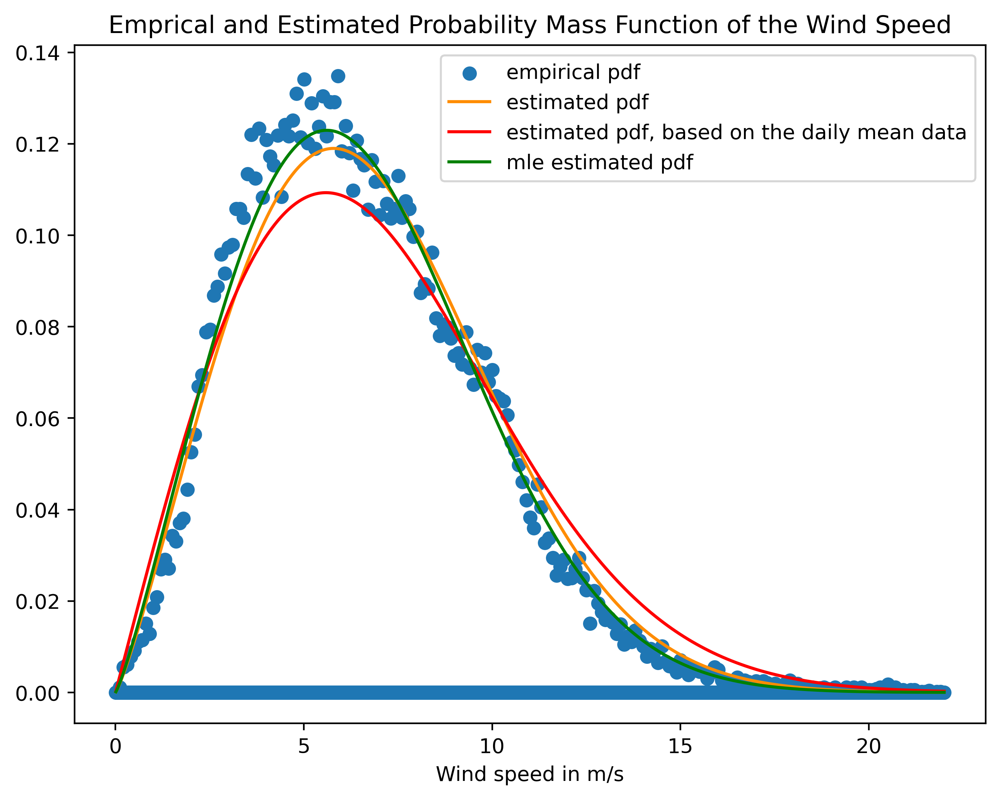

In [37]:
# draw the two estimates
params=get_weibull_parameters(df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"])
mean_params=get_weibull_parameters(daily_df[(daily_df['DATE'].dt.year == 2022)]["Mean"])
mle_weibull=Weibull.estimate(df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"].dropna().replace(0.0, 1e-5).to_numpy())

max_included_windspeed=int(df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"].max()+1)
number_of_bins=2000
edges=np.linspace(0,max_included_windspeed, number_of_bins)
empiric_pdf= np.histogram(df[(df['MESS_DATUM'].dt.year == 2022)]["FF_10_wind"], bins=edges)[0]
empiric_pdf=empiric_pdf/(empiric_pdf.sum())*10

plt.scatter( edges[1:], empiric_pdf, label='empirical pdf')
plt.plot( edges[1:], weibull_pdf( params[0],params[1],edges[1:]), color='darkorange', label='estimated pdf')

plt.plot( edges[1:], weibull_pdf( mean_params[0]-0.7,mean_params[1]-0.1,edges[1:]), color='red', label='estimated pdf, based on the daily mean data')

plt.plot( edges[1:], mle_weibull.pdf(edges[1:]), color='green', label='mle estimated pdf')
plt.legend()
plt.title('Emprical and Estimated Probability Mass Function of the Wind Speed')
plt.xlabel('Wind speed in m/s')
plt.show()

# Do the analyis of z-scores by month:

In [38]:
print(early_df)

        SOUID       DATE    FG  Q_FG  YEAR  bf_classification
2436   115639 1959-01-01  14.7     0  1959                  7
2437   115639 1959-01-02  14.2     0  1959                  7
2438   115639 1959-01-03  12.5     0  1959                  6
2439   115639 1959-01-04  10.5     0  1959                  5
2440   115639 1959-01-05   9.5     0  1959                  5
...       ...        ...   ...   ...   ...                ...
26106  115639 2023-10-22   7.8     0  2023                  4
26107  115639 2023-10-23   4.5     0  2023                  3
26108  115639 2023-10-24   8.4     0  2023                  5
26109  115639 2023-10-25   8.3     0  2023                  5
26110  115639 2023-10-26   8.6     0  2023                  5

[23574 rows x 6 columns]


In [39]:
for m in range(1,13):
    early_yearly_df[f'{m}_mb_parameter_k']=0.0
    early_yearly_df[f'{m}_mb_parameter_a']=0.0

for y in early_yearly_df['YEAR']:
    for m in range(1,13):
        if len(early_df[(early_df['DATE'].dt.year == y)&(early_df['DATE'].dt.month == m)]["FG"])>15: # this is an arbitrary number!
            early_yearly_df.loc[y-1952, f'{m}_mb_parameter_k' ], early_yearly_df.loc[y-1952, f'{m}_mb_parameter_a' ]=get_weibull_parameters(early_df[(early_df['DATE'].dt.year == y)&(early_df['DATE'].dt.month == m)]["FG"])


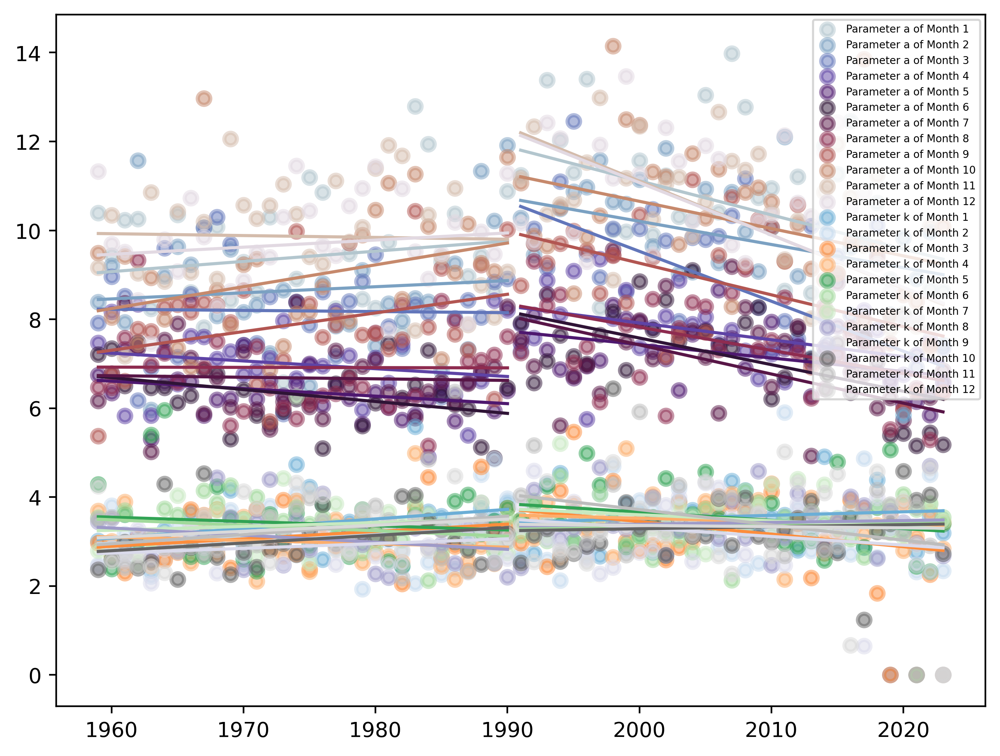

In [40]:
month_colors = plt.cm.twilight(np.linspace(0,1,13))
month_colors2 = plt.cm.tab20c(np.linspace(0,1,13))
k_slopes=[]
a_slopes=[]

for m in range(1,13,1):
    plt.scatter(early_yearly_df['YEAR'], early_yearly_df[f'{m}_mb_parameter_a'], color= month_colors[m], label=f'Parameter a of Month {m}', alpha=0.5 , lw=2)
    

    
    m_a_pol=np.polyfit(early_yearly_df['YEAR'][0:32],(early_yearly_df[f'{m}_mb_parameter_a'])[0:32], 1)
    m_a_model = np.poly1d(m_a_pol)
    plt.plot(early_yearly_df['YEAR'][0:32],m_a_model(early_yearly_df['YEAR'][0:32]),  color=month_colors[m])

    m_a_pol=np.polyfit(early_yearly_df['YEAR'][32:],(early_yearly_df[f'{m}_mb_parameter_a'])[32:], 1)
    m_a_model = np.poly1d(m_a_pol)
    plt.plot(early_yearly_df['YEAR'][32:],m_a_model(early_yearly_df['YEAR'][32:]),  color=month_colors[m])
    a_slopes.append(m_a_pol[0])


for m in range(1,13,1):
    
    plt.scatter(early_yearly_df['YEAR'], early_yearly_df[f'{m}_mb_parameter_k'], color= month_colors2[m], label=f'Parameter k of Month {m}', alpha=0.5 , lw=2)
    m_k_pol=np.polyfit(early_yearly_df['YEAR'][0:32],(early_yearly_df[f'{m}_mb_parameter_k'])[0:32], 1)
    m_k_model = np.poly1d(m_k_pol)
    plt.plot(early_yearly_df['YEAR'][0:32],m_k_model(early_yearly_df['YEAR'][0:32]),  color=month_colors2[m])

    m_k_pol=np.polyfit(early_yearly_df['YEAR'][32:],(early_yearly_df[f'{m}_mb_parameter_k'])[32:], 1)
    m_k_model = np.poly1d(m_k_pol)
    plt.plot(early_yearly_df['YEAR'][32:],m_k_model(early_yearly_df['YEAR'][32:]),  color=month_colors2[m])
    k_slopes.append(m_k_pol[0])

plt.legend(loc='best', fontsize=5)
plt.show()




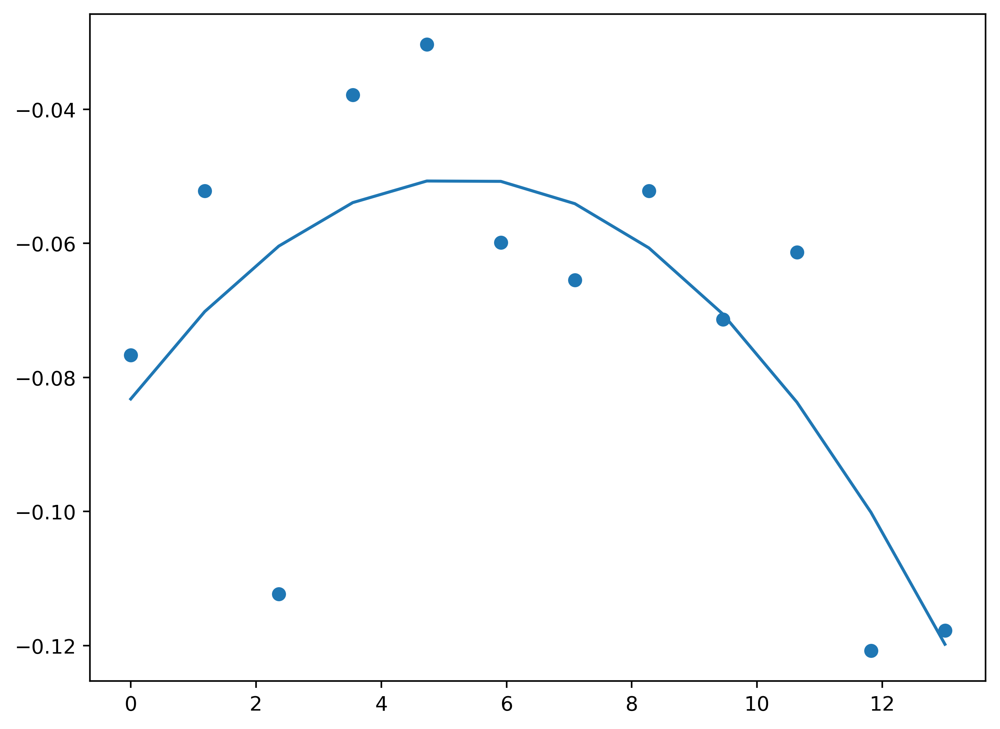

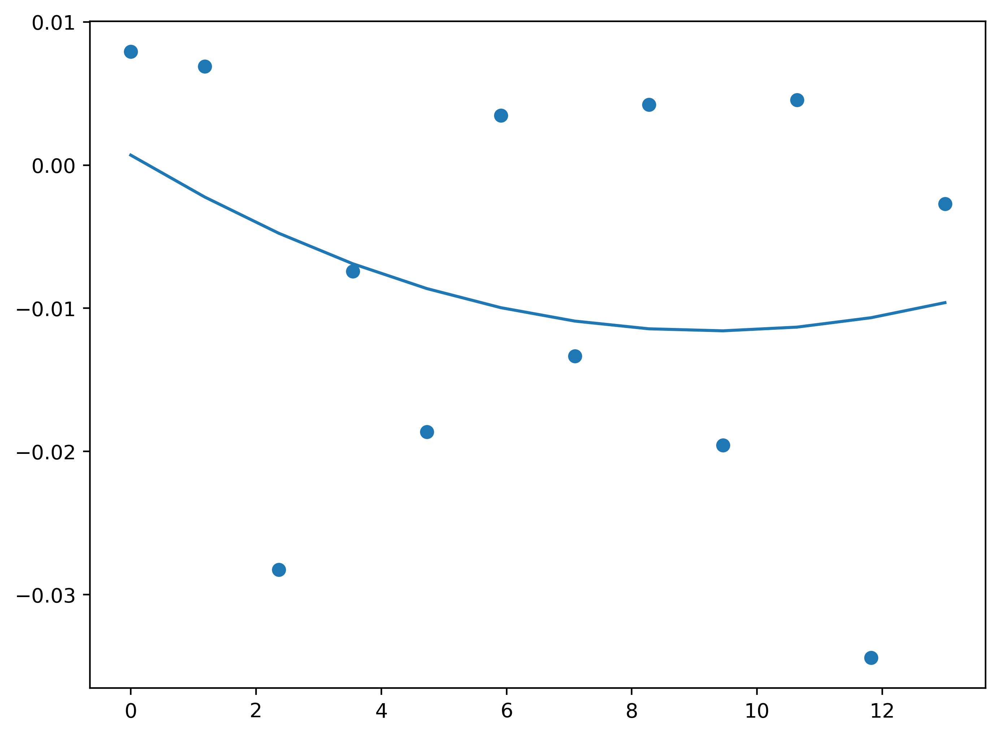

In [41]:
plt.scatter(np.linspace(0, 13, 12),a_slopes)
pol=np.polyfit(np.linspace(0, 13, 12), a_slopes, 2)
model = np.poly1d(pol)
plt.plot(np.linspace(0, 13, 12),model(np.linspace(0, 13, 12)))
plt.show()

plt.scatter(np.linspace(0, 13, 12),k_slopes)
pol=np.polyfit(np.linspace(0, 13, 12), k_slopes, 2)
model = np.poly1d(pol)
plt.plot(np.linspace(0, 13, 12),model(np.linspace(0, 13, 12)))
plt.show()


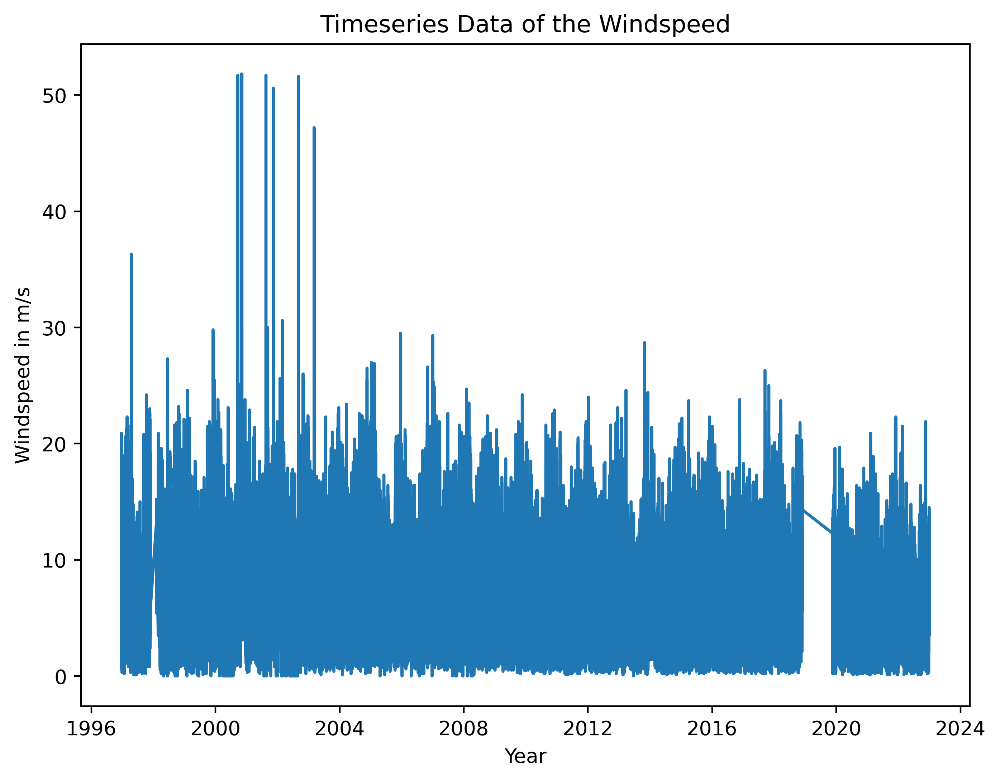

In [42]:
plt.plot(df[df['FF_10_wind']>-1]['MESS_DATUM'], df[df['FF_10_wind']>-1]['FF_10_wind'])

plt.xlabel('Year')
plt.ylabel('Windspeed in m/s')
plt.title('Timeseries Data of the Windspeed')
plt.show()

# Data from the other station on Helgoland 

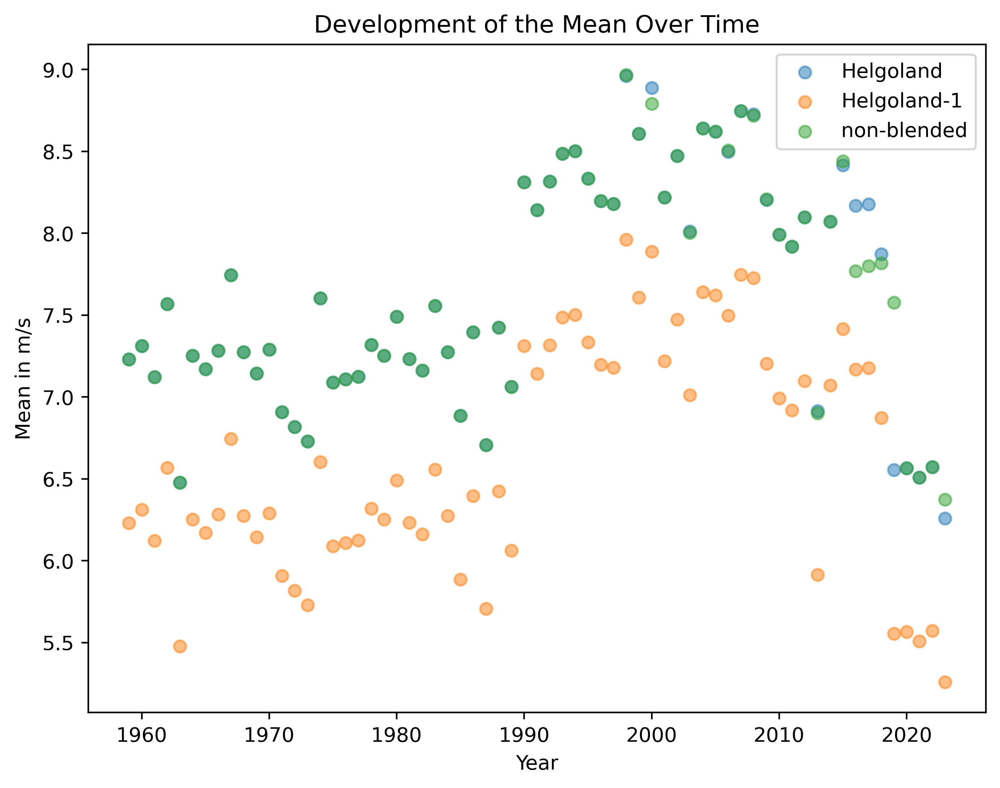

In [102]:
# contains the daily average windspeed starting in the 1950s
alt_df = pd.read_csv(
    "FG_SOUID115639.csv",
    skiprows=19,
    sep=",",
    index_col=None,
    skipfooter=0,
    engine="python",
)
    

# convert the date and divide the windspeed by 10, so it's given in m/s
alt_df['DATE']=pd.to_datetime(alt_df["DATE"], format="%Y%m%d")
alt_df['FG']=alt_df['FG']/10
alt_df['YEAR']=alt_df['DATE'].dt.year

alt_df=alt_df[alt_df['FG']>-100]

alt_df
alt_yearly=pd.DataFrame()
alt_yearly['YEAR']=np.linspace(1959, 2023,65)

alt_yearly['Mean']=0.0
for y in alt_yearly['YEAR']:
    alt_yearly.loc[y-1959, 'Mean']=alt_df[alt_df['YEAR']==y]['FG'].mean() 


plt.scatter(early_yearly_df['YEAR'], early_yearly_df['Mean'], label='Helgoland', alpha=0.5)

plt.scatter(early_yearly_df['YEAR'], early_yearly_df['Mean']-1, label='Helgoland-1', alpha=0.5)
plt.scatter(alt_yearly['YEAR'], alt_yearly['Mean'], label='non-blended', alpha=0.5)

plt.title('Development of the Mean Over Time')
plt.ylabel('Mean in m/s')
plt.xlabel('Year')
plt.legend(loc='best')
plt.show()


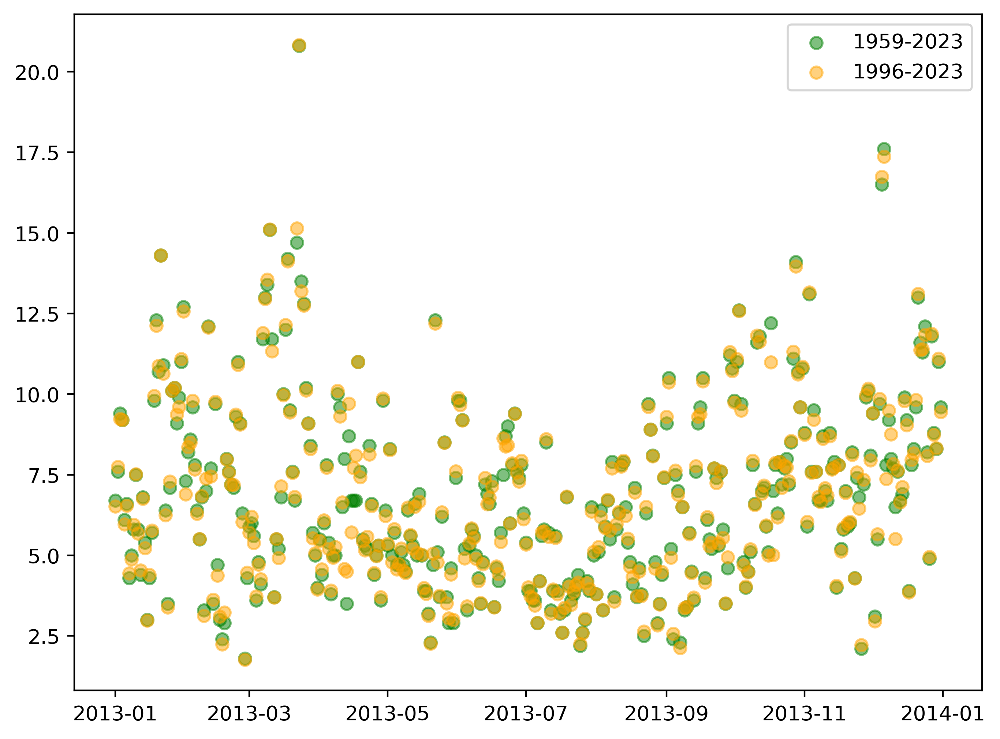

In [177]:
y=2013
plt.scatter(early_df[early_df['DATE'].dt.year==y]['DATE'],early_df[early_df['DATE'].dt.year==y]['FG'], color='green', alpha=0.5, label='1959-2023')
plt.scatter(daily_df[daily_df['DATE'].dt.year==y]['DATE'], daily_df[daily_df['DATE'].dt.year==y]['Mean'], color='orange', alpha=0.5, label='1996-2023')
plt.legend()
plt.show()



,YEAR,parameter_k,parameter_a,z_parameter_k,z_parameter_a
0,1996.0,1.947722,10.414288,-1.232227,0.861913
1,1997.0,2.123697,9.585439,-0.467624,0.165017
2,1998.0,2.305721,9.595541,0.323257,0.173511
3,1999.0,2.309476,10.071016,0.339575,0.573290
4,2000.0,1.558472,13.471401,-2.923491,3.432330
5,2001.0,1.883472,10.558053,-1.511387,0.982791
6,2002.0,1.764447,10.100300,-2.028547,0.597912
7,2003.0,2.044520,9.988534,-0.811644,0.503939
8,2004.0,2.469897,9.843337,1.036592,0.381858
9,2005.0,2.507345,10.217847,1.199301,0.696746


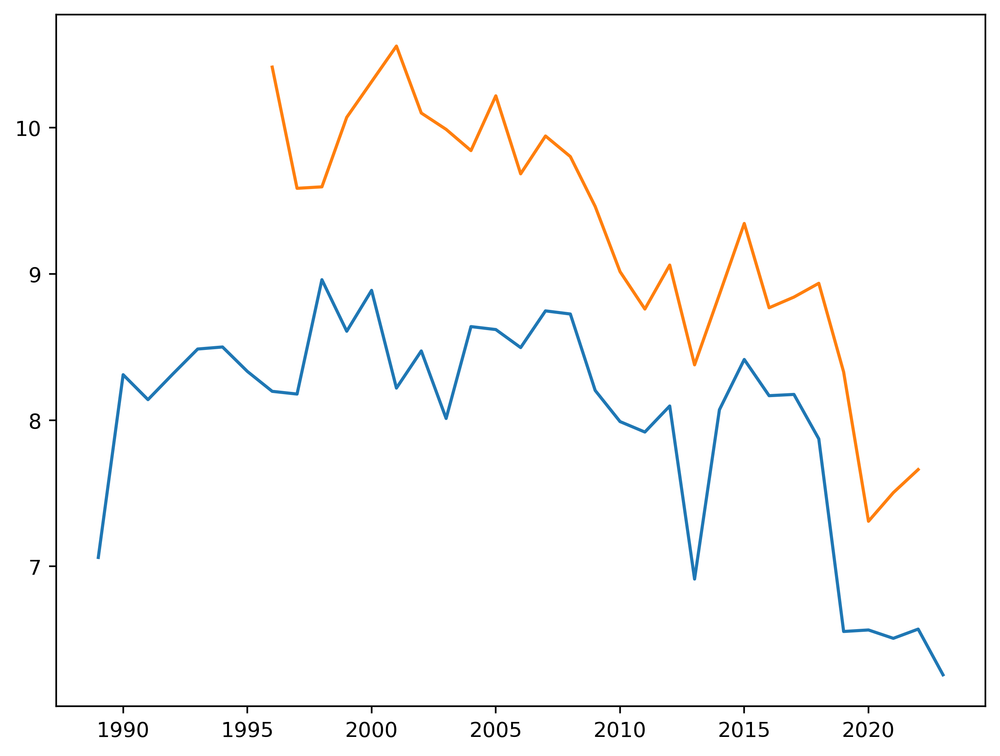

In [221]:
#print(early_yearly_df['YEAR'][32:-1])
#print(early_yearly_df['Mean'][32:-1])  

plt.plot(early_yearly_df['YEAR'][30:],early_yearly_df['Mean'][30:] )

#print(yearly_df['parameter_k'])
plt.plot(yearly_df[yearly_df['YEAR']!=2000]['YEAR'],yearly_df[yearly_df['YEAR']!=2000]['parameter_a'] )
yearly_df

1959
0.5708433601477629
1960
0.8339406333006114
1961
1.4425918819738082
1962
1.2942633962168464
1963
3.1952267449050122
1964
3.6058594199591636
1965
4.221211837011169
1966
4.604216360855243
1967
4.032330066161302
1968
4.467507614079975
1969
5.188497831327195
1970
5.625700482385734
1971
6.923304871033604
1972
8.527249734760147
1973
10.481569097529526
1974
10.20258885515554
1975
11.296470992570974
1976
12.383916995912957
1977
13.472045142637835
1978
14.053291255476426
1979
14.856951412734823
1980
15.013095893594674
1981
15.940300761275989
1982
17.123449456681083
1983
17.172890963952703
1984
18.09955731431418
1985
20.29344519902589
1986
20.95448465133977
1987
23.959674374548648
1988
24.645012320647496
1989
26.670884081882342
1990
24.353152444810018
1991
22.747792797963676
1992
20.681236380061144
1993
18.236904498563504
1994
15.932029792003805
1995
14.236256410756816
1996
12.991410728005329
1997
11.861976632075784
1998
9.057812494026322
1999
7.280591587021734
2000
5.227000161140546
2001
4.

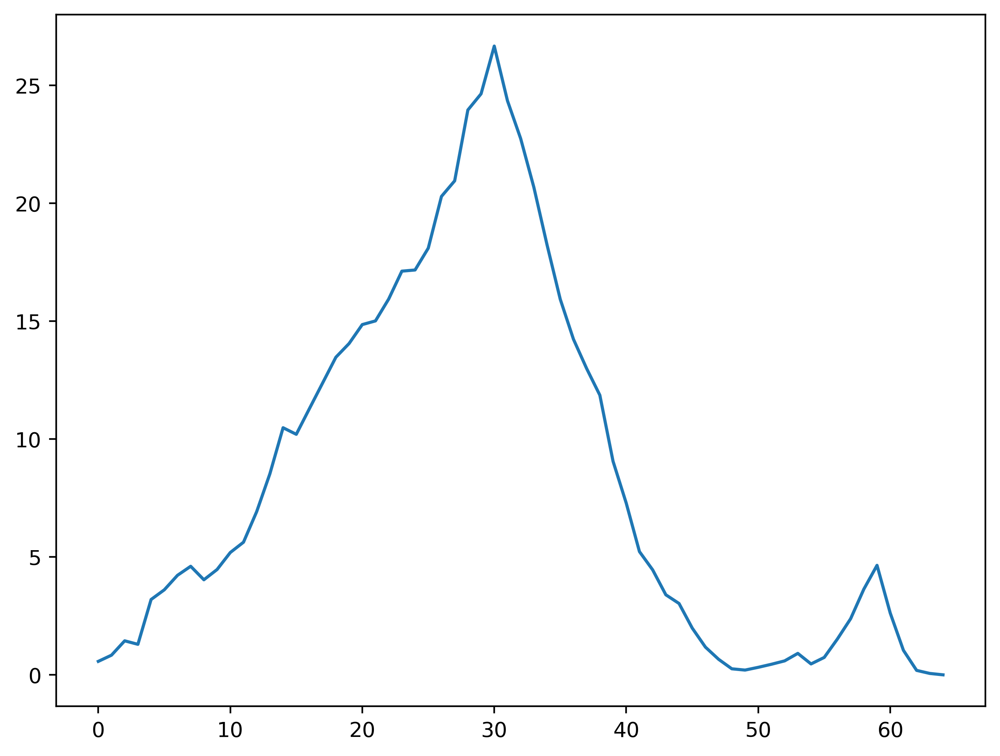

In [206]:
#early_yearly_df
T=[]
mean=early_yearly_df['Mean'].mean()
s=early_yearly_df['Mean'].std()
for y in early_yearly_df['YEAR']:
    y=int(y-1958)
    
    z_1=0
    for i in range (1,y+1):
        z_1=z_1 + (early_yearly_df.loc[i+6, 'Mean'] - mean)/s
    z_1=1/y* z_1

    z_2=0
    for i in range (y+1,2022-1958):
        z_2=z_2 + (early_yearly_df.loc[i+6, 'Mean'] - mean)/s
    z_2=1/(len(early_yearly_df['YEAR'])-y+1)* z_2

    print(y+1958)
    print(y*(z_1**2 )+ (len(early_yearly_df['YEAR'])-y+1)*(z_2)**2)

    T.append(y*(z_1**2 )+ (len(early_yearly_df['YEAR'])-y+1)*(z_2)**2)


#print(T) 

plt.plot(T)

8.037843993008774
1989
0.5302414848687211
1990
1.6796148863416511
1991
4.141006627331878
1992
5.153072271394651
1993
8.693568858323694
1994
9.757815681131815
1995
12.345228174402063
1996
10.313679795662718
1997
9.266511692111624
1998
7.933609900610888
1999
6.4139540106851545
2000
5.138074920469885
2001
4.405234751814669
2002
4.027417866154108
2003
3.734285626422947
2004
2.2888709764881643
2005
1.5941225721920542
2006
0.8026888479329577
2007
0.6872948766651181
2008
0.4281736174333887
2009
0.46467360369192295
2010
0.19576266014657187
2011
0.06272610156246133
2012
0.050468119682180894
2014
0.21462344252041726
2015
0.2981084077792982
2016
0.2797955228640219
2017
0.22542089314114094
2018
0.2727571948335271
2019
0.1439952661357471
2020
0.16862350068074458
2021
0.05326626754521953
2022
0.04932511964398212
[0.5302414848687211, 1.6796148863416511, 4.141006627331878, 5.153072271394651, 8.693568858323694, 9.757815681131815, 12.345228174402063, 10.313679795662718, 9.266511692111624, 7.933609900610

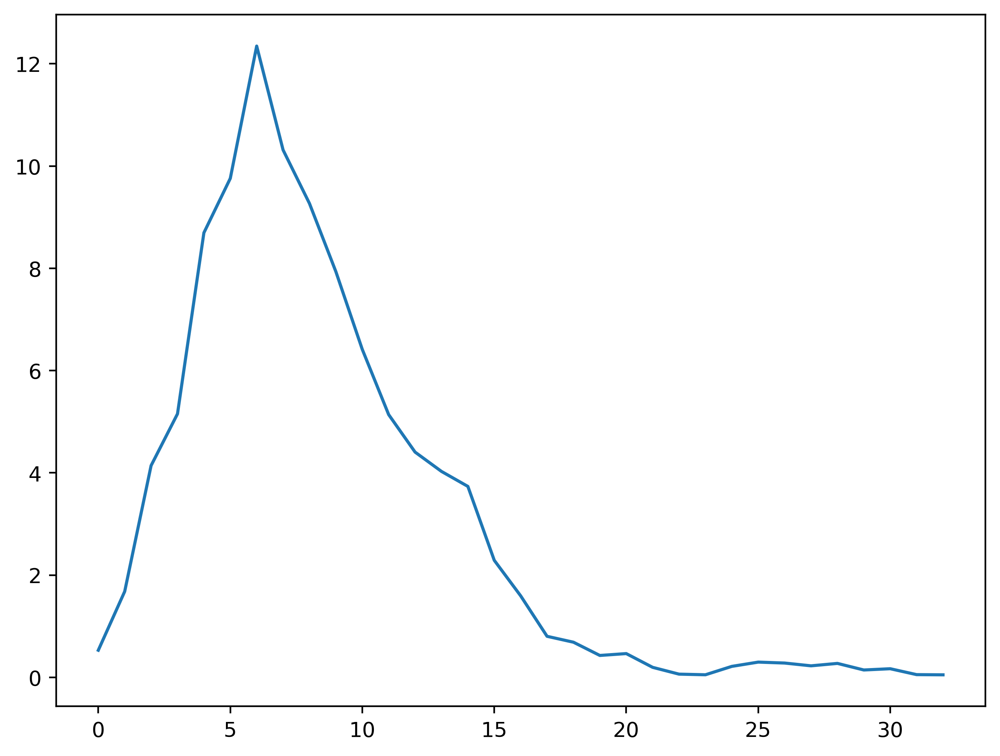

In [205]:
#early_yearly_df
T=[]
mean=early_yearly_df[early_yearly_df['YEAR']!=2013]['Mean'][38:].mean()
print(mean)
s=early_yearly_df[early_yearly_df['YEAR']!=2013]['Mean'][38:].std()
j=0
for y in range(1989, 2023):
    if y==2013:
        j=1
        continue
    #j=0
    z_1=0
    for i in range (1989,y+1):
        #print(i)
        if i==2013:
            continue
        z_1=z_1 + (early_yearly_df.loc[i-1958, 'Mean'] - mean)/s
    z_1=1/(y-1988-j)* z_1
    

    z_2=0
    for i in range (y+1,2023):
        
        if i==2013:
            continue
        z_2=z_2 + (early_yearly_df.loc[i-1958, 'Mean'] - mean)/s
    z_2=1/(2023-y+ (1-j))* z_2
    print(y)
    print((y-1988-j)*(z_1**2 )+ (2023-y+ (1-j))*((z_2)**2))

    T.append((y-1988-j)*(z_1**2 )+ (2023-y + (1-j))*((z_2)**2))


print(T) 

plt.plot(T)